<a href="https://colab.research.google.com/github/ranjan0601/Netflix_movie_clasffication_unsupervised/blob/main/Unsupervised_Project_Amit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  **Netflix Movie and TV Show Clustering**

##### **Project Type**    - Unsupervised ML
##### **Contribution**    - Individual

# **Project Summary -**

This project is ML unsupervised learning project. This is based on text based clustering hence, library like nltk, steming, stopwords, TF-IDF Vectorizer, PCA and visualization library like wordcloud and plotly are used. We have netflix data which has multiple text based column including, title, genre, description, casting, director etc. After EDA including data wrangling, handling missing data, univarient and bivarient analysis, we jumped to text based clustering.

Based on Silhouette Coefficient and kmeans we have made 14 clustering and label them based on description. Later, we also used cosine_similarity to provide an output based on user search and description similarity. 

# **GitHub Link -**

https://github.com/ranjan0601/Netflix_movie_clasffication_unsupervised/blob/main/Unsupervised_Project_Amit.ipynb

# **Problem Statement -**

Business Context

This dataset consists of tv shows and movies avaliable on Netflix as of 2019. The dataset is collected from Flixable which is a thrid-party Netflix search engine. In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service's number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external dataset such as IMDB rating, can also provide many interesting findings.

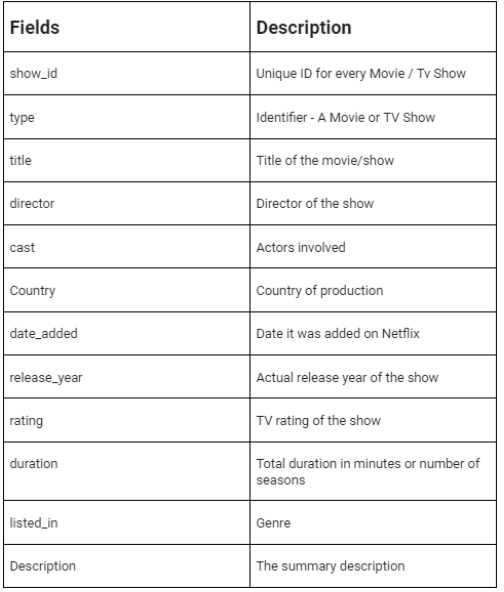

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.


# ***Let's Begin !***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("/content/drive/MyDrive/Almabatter/Unsupervised_Project/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")

In [3]:
#head of data
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [4]:
#basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [5]:
# Finding out null columns only
df.isnull().sum()[df.isnull().sum().sort_values(ascending = False) != 0]

director      2389
cast           718
country        507
date_added      10
rating           7
dtype: int64

In [6]:
null_columns = df.isnull().sum()[df.isnull().sum().sort_values(ascending = False) != 0]

In [7]:
null_columns

director      2389
cast           718
country        507
date_added      10
rating           7
dtype: int64

<BarContainer object of 5 artists>

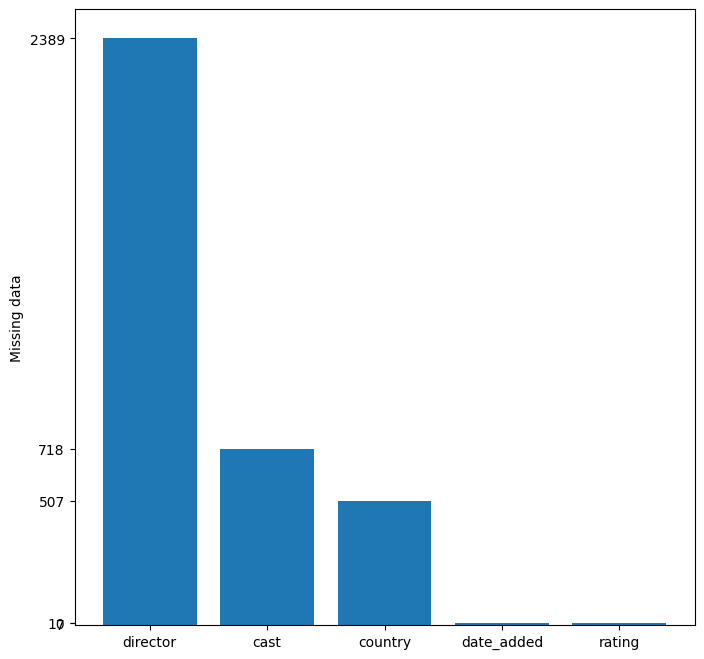

In [8]:
plt.figure(figsize = (8,8))
plt.xticks(np.arange(len(null_columns)),null_columns.index, rotation = 0)
plt.yticks(null_columns,rotation=0)
plt.ylabel('Missing data')
plt.bar(np.arange(len(null_columns)), null_columns)


## <b> Handling Missing value

In [9]:
df.director.nunique()

4049

In [10]:
#Handling Null Values
df['director'].fillna(value='No Director',inplace=True)
df['country'].fillna(value=df['country'].mode()[0],inplace=True)

In [11]:
#Handling Null Values
df['cast'].fillna(value='No Cast',inplace=True)

In [12]:
#Handling Null Values
df['date_added'].fillna(value=df['date_added'].mode()[0],inplace=True)
df['rating'].fillna(value=df['rating'].mode()[0],inplace=True)

## <b>  Date Added

In [13]:
# Changing date added to datetime object
df["date_added"] = pd.to_datetime(df["date_added"])

In [14]:
# Extracting important information from date_added column
df["Year_added"] = df["date_added"].dt.year
df["month_added"] = df["date_added"].dt.month

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7787 non-null   object        
 6   date_added    7787 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7787 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  Year_added    7787 non-null   int64         
 13  month_added   7787 non-null   int64         
dtypes: datetime64[ns](1), int64(3), object(10)
memory usage: 851.8+ KB


In [16]:
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
Year_added      0
month_added     0
dtype: int64

## Now we don't have any null value

In [17]:
#Looking for unique values
df.nunique()

show_id         7787
type               2
title           7787
director        4050
cast            6832
country          681
date_added      1512
release_year      73
rating            14
duration         216
listed_in        492
description     7769
Year_added        14
month_added       12
dtype: int64

## <b> Univarient Analysis

In [18]:
# Type has 2 unique catagory as Movie and TV Shows
df.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

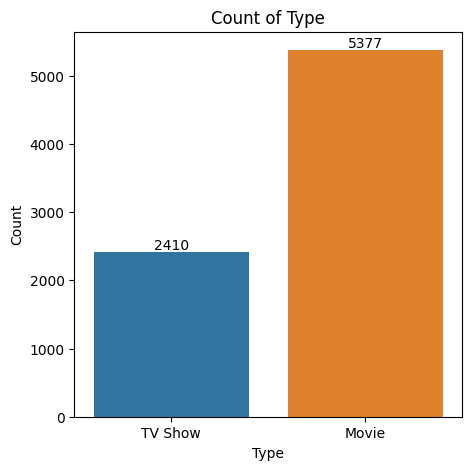

In [19]:
# Visulization of Type column
plt.rcParams["figure.figsize"] = (5,5)
ax = sns.countplot(x='type', data = df)
ax.set_xlabel("Type")
ax.set_ylabel("Count")
ax.set_title("Count of Type")
# Add annotations on top of each bar with the counts
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

## <B> Almost 70% data belongs to Movies and only 30% data belongs to TV Shows

## Visualization using plotly

In [20]:
# Visulization of type column
import plotly.express as px
fig = px.pie(df, names='type', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()


In [21]:
# Visulization of Rating column
import plotly.express as px
fig = px.pie(df, names='rating', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [22]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [23]:
df.pivot_table(index='title', aggfunc='size').head()

title
#Alive                           1
#AnneFrank - Parallel Stories    1
#FriendButMarried                1
#FriendButMarried 2              1
#Roxy                            1
dtype: int64

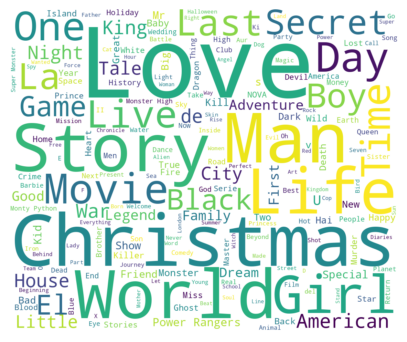

In [24]:
#subsetting df
df_word_cloud = df['title']
text = " ".join(word for word in df_word_cloud)

# Create stopword list:
stopwords = set(STOPWORDS)

# Generate a word cloud image
wordcloud = WordCloud(width=1200, height=1000, stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### **Inference:** It seems like words like "Christmas", "Love", "Man", "World", "Story" are very common in titles.

In [25]:
excluded_director = ["No Director"]

# Filter the DataFrame to exclude specific directors
filtered_df = df[~df['director'].isin(excluded_director)]

# Perform value count calculation on the filtered DataFrame
top_directors = filtered_df['director'].value_counts().head(20)

fig = px.bar(top_directors, x=top_directors.index, y=top_directors.values, color=top_directors.index)
fig.update_layout(
    title='Directors with Most Movies/Shows',
    xaxis=dict(title='Director'),
    yaxis=dict(title='Count'),
    xaxis_tickangle=-45,
    showlegend=True,
    plot_bgcolor='rgb(255, 255, 255)'
)
fig.show()


## <b>  Cast

In [26]:
df.cast.value_counts()

No Cast                                                                                                                                                                       718
David Attenborough                                                                                                                                                             18
Samuel West                                                                                                                                                                    10
Jeff Dunham                                                                                                                                                                     7
Craig Sechler                                                                                                                                                                   6
                                                                                                              

In [27]:
# Convert the cast to get final df for actor
def convert_to_list(df):
  cast_count = {}
  cast_count_final = []
  cast_list = list(df["cast"])
  for each in range(len(cast_list)):
    cast_count_final.extend(str(cast_list[each]).split(","))
  for each in cast_count_final:
    if each not in cast_count:
      cast_count[each] = cast_count_final.count(each)
  return cast_count

In [28]:
# Getting the same in variable
cast_df = convert_to_list(df)

# Creating a dataframe for cast & its counts
cast_df = pd.DataFrame.from_dict(cast_df, orient = "index", columns = ["Count"])

In [29]:
# Understanding the top actors in the movies
cast_df.sort_values("Count", ascending = False).drop("No Cast")

,Count
Anupam Kher,38
Takahiro Sakurai,28
Shah Rukh Khan,27
Om Puri,27
Boman Irani,25
...,...
Juan Manuel Diaz,1
Ana Wills,1
Mauricio Figueroa,1
Matias Maldonado,1


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, ' Anupam Kher'),
  Text(1, 0, ' Takahiro Sakurai'),
  Text(2, 0, 'Shah Rukh Khan'),
  Text(3, 0, ' Om Puri'),
  Text(4, 0, ' Boman Irani'),
  Text(5, 0, ' Andrea Libman'),
  Text(6, 0, ' Paresh Rawal'),
  Text(7, 0, ' Yuki Kaji'),
  Text(8, 0, ' Vincent Tong'),
  Text(9, 0, 'Akshay Kumar'),
  Text(10, 0, ' Kareena Kapoor'),
  Text(11, 0, ' John Cleese'),
  Text(12, 0, 'Adam Sandler'),
  Text(13, 0, ' Naseeruddin Shah'),
  Text(14, 0, ' Ai Kayano'),
  Text(15, 0, ' Yashpal Sharma'),
  Text(16, 0, 'Amitabh Bachchan'),
  Text(17, 0, ' Junichi Suwabe'),
  Text(18, 0, ' Gulshan Grover'),
  Text(19, 0, 'David Attenborough'),
  Text(20, 0, ' Fred Tatasciore'),
  Text(21, 0, ' Asrani'),
  Text(22, 0, ' Kana Hanazawa'),
  Text(23, 0, ' Hassan Hosny'),
  Text(24, 0, ' Manoj Joshi'),
  Text(25, 0, ' Amrish Puri'),
  Text(26, 0, 'Nicolas Cage'),
  T

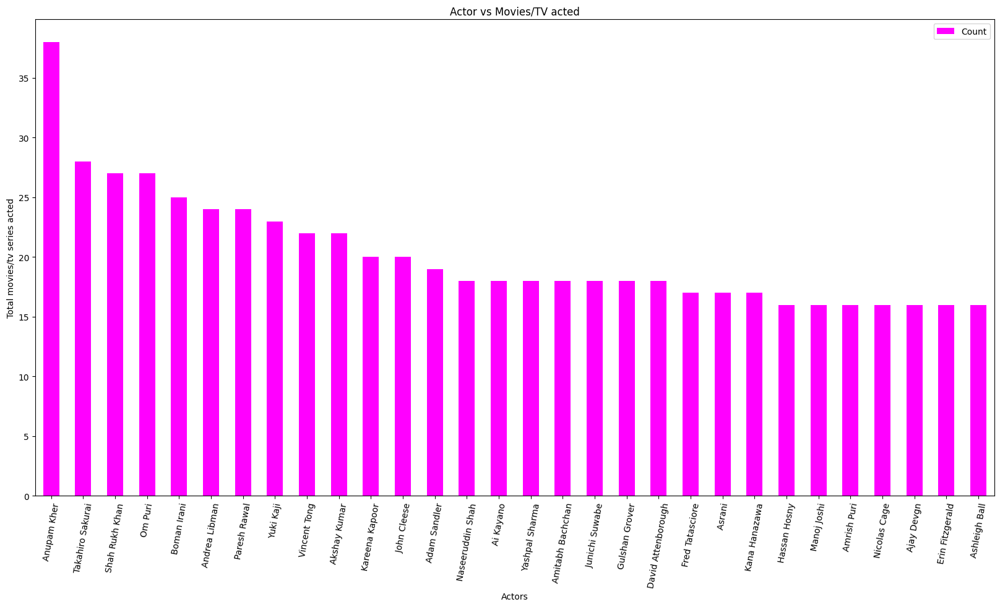

In [30]:
# Plot for Top Actors and Counts
plt.rcParams["figure.figsize"] = (20,10)
cast_df.sort_values("Count" , ascending = False).drop("No Cast").head(30).plot(kind= "bar", color = "magenta" )
plt.xlabel("Actors")
plt.ylabel("Total movies/tv series acted")
plt.title ("Actor vs Movies/TV acted")
plt.xticks(rotation = 80)

## <b>  Inference : Top Five actor with highest number of shows are Anupam Kher, Takahiro Sakurai, SRK, Ohm Puri & Boman Irani

In [31]:
# Looking for countries and number of netflix productions
# Creating a list of tuples with Country name, total_count, tv_show count, & movie count
country_list=[]
tv_show=[]
movies=[]
for i in range(0,len(df)):
  if type(df['country'][i])== str:
    split=df['country'][i].split(',')
    for k in split:
      country_list.append(k.strip())
      if df['type'][i]=='TV Show':
        tv_show.append(k.strip())
      if df['type'][i]== 'Movie':
        movies.append(k.strip())
production_country=list(set([(i,country_list.count(i),tv_show.count(i),movies.count(i)) for i in country_list]))

In [32]:
production_country

[('', 4, 0, 4),
 ('Cayman Islands', 2, 0, 2),
 ('Azerbaijan', 1, 1, 0),
 ('Hong Kong', 102, 5, 97),
 ('Latvia', 1, 0, 1),
 ('Lebanon', 26, 7, 19),
 ('Germany', 199, 42, 157),
 ('Israel', 26, 8, 18),
 ('United Kingdom', 723, 256, 467),
 ('Kazakhstan', 1, 0, 1),
 ('Croatia', 4, 1, 3),
 ('Sweden', 39, 10, 29),
 ('South Africa', 54, 10, 44),
 ('Georgia', 2, 0, 2),
 ('Ireland', 40, 12, 28),
 ('Taiwan', 85, 70, 15),
 ('Bulgaria', 9, 0, 9),
 ('Puerto Rico', 1, 1, 0),
 ('Belarus', 1, 1, 0),
 ('Nicaragua', 1, 0, 1),
 ('Argentina', 82, 18, 64),
 ('Bahamas', 1, 0, 1),
 ('Ukraine', 3, 2, 1),
 ('Portugal', 4, 0, 4),
 ('Pakistan', 24, 4, 20),
 ('Nepal', 2, 0, 2),
 ('Senegal', 3, 1, 2),
 ('Lithuania', 1, 0, 1),
 ('Cyprus', 1, 1, 0),
 ('India', 990, 75, 915),
 ('Samoa', 1, 0, 1),
 ('Colombia', 45, 28, 17),
 ('Liechtenstein', 1, 0, 1),
 ('Sudan', 1, 0, 1),
 ('New Zealand', 28, 8, 20),
 ('Austria', 11, 1, 10),
 ('Mexico', 154, 53, 101),
 ('Spain', 215, 57, 158),
 ('Bermuda', 1, 0, 1),
 ('Slovenia', 3, 0

In [33]:
Country_df = pd.DataFrame(production_country, columns = ["Country", "Production_Count", "TV-Shows", "Movies"])
Country_df = Country_df.sort_values("Production_Count", ascending = False)
Country_df = Country_df.reset_index()
Country_df = Country_df.drop("index", axis = 1)

In [34]:
Country_df

,Country,Production_Count,TV-Shows,Movies
0,United States,3804,1143,2661
1,India,990,75,915
2,United Kingdom,723,256,467
3,Canada,412,126,286
4,France,349,84,265
...,...,...,...,...
113,Slovakia,1,0,1
114,Paraguay,1,0,1
115,Puerto Rico,1,1,0
116,Jamaica,1,0,1


In [35]:
import plotly.graph_objects as go
fig = go.Figure(data=[
    go.Bar(name='Production Count', x=Country_df.head(10)['Country'], y=Country_df.head(10)['Production_Count']),
    go.Bar(name='TV Shows', x=Country_df.head(10)['Country'], y=Country_df.head(10)['TV-Shows']),
    go.Bar(name='Movies', x=Country_df.head(10)['Country'], y=Country_df.head(10)['Movies'])
])

fig.update_layout(
    barmode='group',
    xaxis=dict(title='Country'),
    yaxis=dict(title='Production Value'),
    title='Country-wise production distribution'
)

fig.show()

## <b>  Release Year

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7787 non-null   object        
 6   date_added    7787 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7787 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  Year_added    7787 non-null   int64         
 13  month_added   7787 non-null   int64         
dtypes: datetime64[ns](1), int64(3), object(10)
memory usage: 851.8+ KB


In [37]:
df.release_year.value_counts()

2018    1121
2017    1012
2019     996
2016     882
2020     868
        ... 
1925       1
1964       1
1966       1
1947       1
1959       1
Name: release_year, Length: 73, dtype: int64

In [38]:
# Compute value counts of release_year
temp_df1 = df['release_year'].value_counts().reset_index()

# Create bar trace
trace1 = go.Bar(
    x=temp_df1['index'],
    y=temp_df1['release_year'],
    marker=dict(color='rgb(255, 165, 0)', line=dict(color='rgb(10, 0, 0)', width=1.5))
)

# Define layout
layout = go.Layout(
    template="simple_white",
    title='Content Release Over the Year',
    xaxis=dict(title='Rating'),
    yaxis=dict(title='Content Released')
)

# Create figure
fig = go.Figure(data=[trace1], layout=layout)

# Show figure
fig.show()


## Rating

In [39]:
#Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
df['target_ages'] = df['rating'].apply(lambda x: ratings[x] if x in ratings else 'Unknown')

In [40]:
# Compute the count of each target age group
age_group_counts = df['target_ages'].value_counts()

# Create a bar trace
trace = go.Bar(
    x=age_group_counts.index,
    y=age_group_counts.values,
    marker=dict(color='rgb(0, 128, 128)')
)

# Define the layout
layout = go.Layout(
    title='Count of Target Age Groups',
    xaxis=dict(title='Target Age Groups'),
    yaxis=dict(title='Count')
)

# Create the figure
fig = go.Figure(data=[trace], layout=layout)

# Show the figure
fig.show()


## As expected, hightest content is for Adults followed by Teens than older kids and than kids at last

## <b> Duration

In [41]:
df.duration.unique()

array(['4 Seasons', '93 min', '78 min', '80 min', '123 min', '1 Season',
       '95 min', '119 min', '118 min', '143 min', '103 min', '89 min',
       '91 min', '149 min', '144 min', '124 min', '87 min', '110 min',
       '128 min', '117 min', '100 min', '2 Seasons', '84 min', '99 min',
       '90 min', '102 min', '104 min', '105 min', '56 min', '125 min',
       '81 min', '97 min', '106 min', '107 min', '109 min', '44 min',
       '75 min', '101 min', '3 Seasons', '37 min', '113 min', '114 min',
       '130 min', '94 min', '140 min', '135 min', '82 min', '70 min',
       '121 min', '92 min', '164 min', '53 min', '83 min', '116 min',
       '86 min', '120 min', '96 min', '126 min', '129 min', '77 min',
       '137 min', '148 min', '28 min', '122 min', '176 min', '85 min',
       '22 min', '68 min', '111 min', '29 min', '142 min', '168 min',
       '21 min', '59 min', '20 min', '98 min', '108 min', '76 min',
       '26 min', '156 min', '30 min', '57 min', '150 min', '133 min',
       '1

In [42]:
df.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7787 non-null   object        
 6   date_added    7787 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7787 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  Year_added    7787 non-null   int64         
 13  month_added   7787 non-null   int64         
 14  target_ages   7787 non-null   object        
dtypes: datetime64[ns](1), int64(3), object

In [44]:
df.show_id.nunique()

7787

In [45]:
df_Movie_duration = df[df["type"] == "Movie"][["show_id", "type", "duration"]]

In [46]:
# Replacing 'min' from the duration and make it string data type
df_Movie_duration['duration'] = df_Movie_duration['duration'].str.replace(' min','')
df_Movie_duration['duration'] = df_Movie_duration['duration'].astype(str)

In [47]:
# Creating a dataframe for TV Show
df_TVshow_duration = df[df["type"] == "TV Show"][["show_id", "type", "duration"]]

In [48]:
df_TVshow_duration.duration.unique()

array(['4 Seasons', '1 Season', '2 Seasons', '3 Seasons', '5 Seasons',
       '9 Seasons', '8 Seasons', '6 Seasons', '11 Seasons', '7 Seasons',
       '13 Seasons', '12 Seasons', '10 Seasons', '16 Seasons',
       '15 Seasons'], dtype=object)

In [49]:
# Replacing 'min' from the duration and make it string data type
df_TVshow_duration['duration'] = df_TVshow_duration['duration'].str.replace(r'\bSeasons?\b', '', regex=True)
df_TVshow_duration['duration'] = df_TVshow_duration['duration'].astype(str)

In [50]:
df_Movie_duration["duration"] = np.where(df_Movie_duration["duration"].isnull(), 0, df_Movie_duration["duration"])
df_TVshow_duration["duration"] = np.where(df_TVshow_duration["duration"].isnull(), 0, df_TVshow_duration["duration"])

In [51]:
df_Movie_duration['duration'] = df_Movie_duration['duration'].astype(int)
df_TVshow_duration["duration"] = df_TVshow_duration["duration"].astype(int)

<ipython-input-52-7dff3d93fc25>:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




<Axes: xlabel='duration', ylabel='Density'>

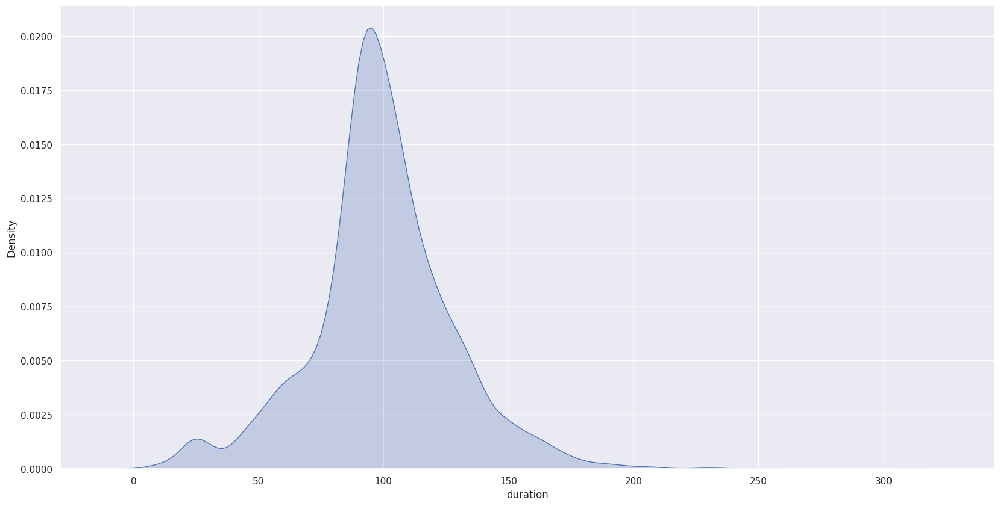

In [52]:
#Analysis the distribution on Movie duration 
sns.set(style="darkgrid")
sns.kdeplot(data=df_Movie_duration[df_Movie_duration['duration'] != 0]['duration'], shade=True)

### It seems like Movie are generally between 70 to 120 minu 

<ipython-input-53-033c6289dcb0>:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




<Axes: xlabel='duration', ylabel='Density'>

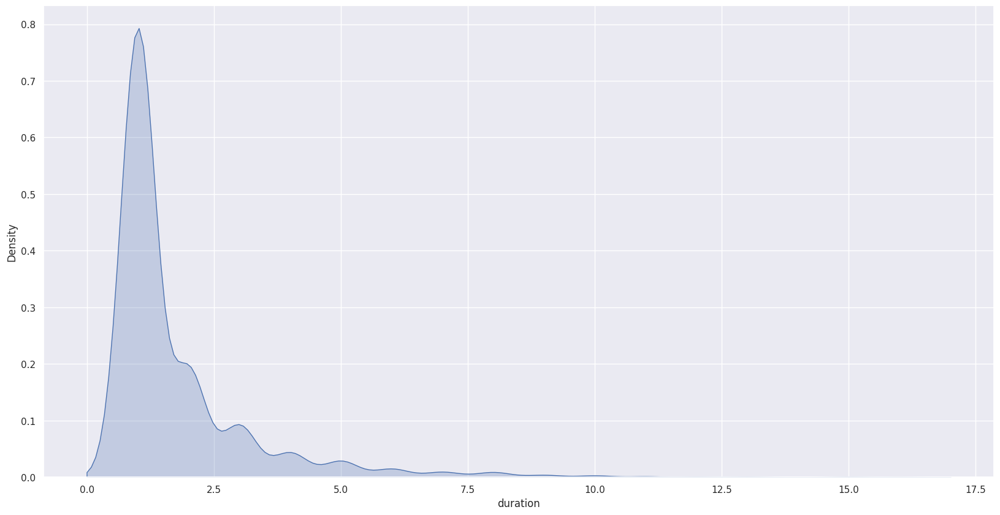

In [53]:
#Analysis the distribution on TV Show Duration
sns.set(style="darkgrid")
sns.kdeplot(data=df_TVshow_duration[df_TVshow_duration['duration'] != 0]['duration'], shade=True)

### It seems like TV Shows are generally 1 to 2 seasson long

## Geting Genre datafram from listed in column

In [54]:
#genre to list
def convert_to_list(df):
  genre_count = {}
  genre_count_final = []
  genre_list = list(df['listed_in'])
  for each in range(len(genre_list)):
    genre_count_final.extend(genre_list[each].split(", "))
  for each in genre_count_final:
    if each not in genre_count:
      genre_count[each] = genre_count_final.count(each)
  return genre_count

In [55]:
#to list
genre_dict = convert_to_list(df)
#make genre df
genre_df = pd.DataFrame.from_dict(genre_dict, orient='index', columns=['count']).sort_values('count', ascending=False)

In [56]:
genre_df 

,count
International Movies,2437
Dramas,2106
Comedies,1471
International TV Shows,1199
Documentaries,786
Action & Adventure,721
TV Dramas,704
Independent Movies,673
Children & Family Movies,532
Romantic Movies,531


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, 'International Movies'),
  Text(1, 0, 'Dramas'),
  Text(2, 0, 'Comedies'),
  Text(3, 0, 'International TV Shows'),
  Text(4, 0, 'Documentaries'),
  Text(5, 0, 'Action & Adventure'),
  Text(6, 0, 'TV Dramas'),
  Text(7, 0, 'Independent Movies'),
  Text(8, 0, 'Children & Family Movies'),
  Text(9, 0, 'Romantic Movies'),
  Text(10, 0, 'TV Comedies'),
  Text(11, 0, 'Thrillers'),
  Text(12, 0, 'Crime TV Shows'),
  Text(13, 0, "Kids' TV"),
  Text(14, 0, 'Docuseries'),
  Text(15, 0, 'Romantic TV Shows'),
  Text(16, 0, 'Stand-Up Comedy'),
  Text(17, 0, 'Music & Musicals'),
  Text(18, 0, 'Horror Movies'),
  Text(19, 0, 'British TV Shows'),
  Text(20, 0, 'Reality TV'),
  Text(21, 0, 'Sci-Fi & Fantasy'),
  Text(22, 0, 'Sports Movies'),
  Text(23, 0, 'Korean TV Shows'),
  Text(24, 0, 'TV Action & Adventure'),
  Text(25, 0, 'Anime Series'),
  Text(26

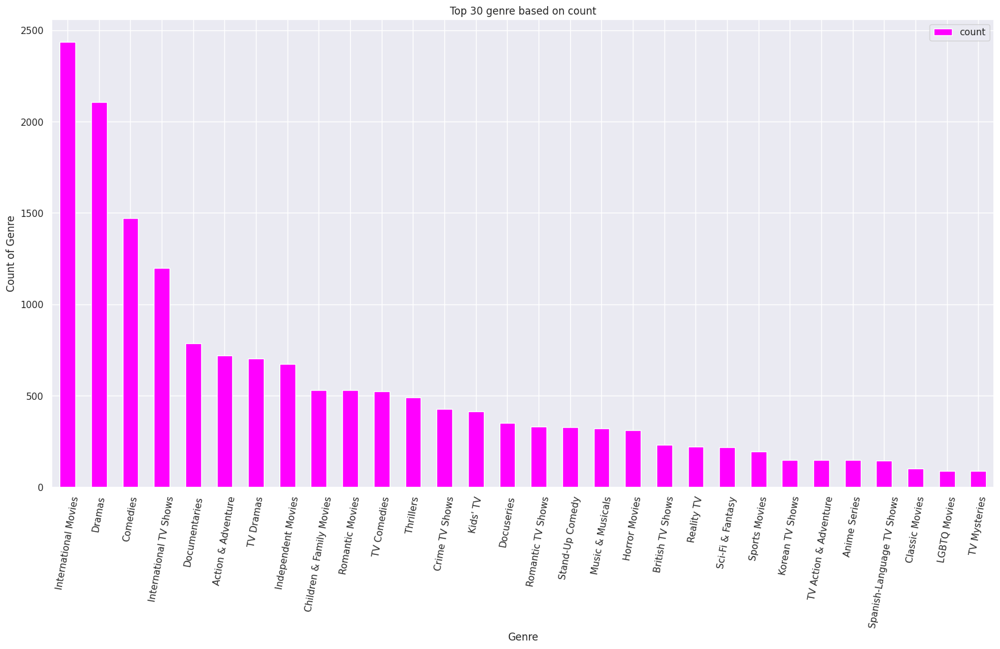

In [57]:
# Plot for Top Actors and Counts
plt.rcParams["figure.figsize"] = (20,10)
genre_df.sort_values("count" , ascending = False).head(30).plot(kind= "bar", color = "magenta" )
plt.xlabel("Genre")
plt.ylabel("Count of Genre")
plt.title ("Top 30 genre based on count")
plt.xticks(rotation = 80)

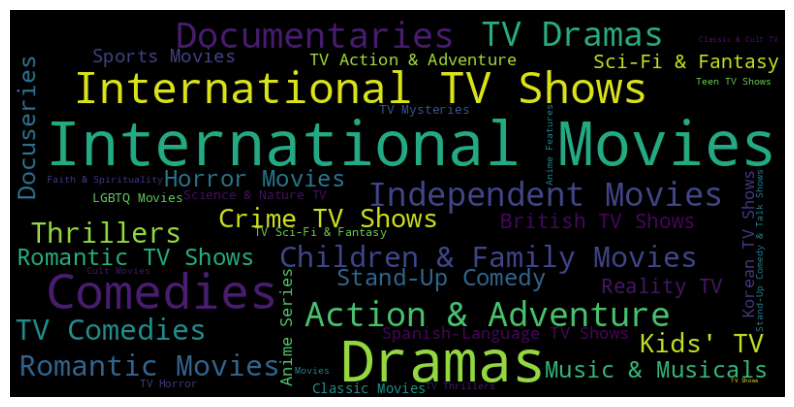

In [58]:
# This can also be visulaized in word cloud
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(genre_dict)
# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## <b>  Inference : We can clearly say that International MOvies, International TV Shows, Action & Adventure, Comedies, Dramas are the most frequent genre

## <b> Description Column

In [59]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [60]:
#word cloud for user rating review
def func_select_Category(category_name,category_column,column_of_choice):
  df_word_cloud = df[[category_column,column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud[category_column]==category_name]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  # Display the generated image:
  # the matplotlib way:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [61]:
# Define a function which create wordcloud on description filtering types like movie and tv shows
def func_select_Catagory(Catagory_name, catagory_column,column_of_choice):
  df_word_cloud = df[[catagory_column, column_of_choice]]
  df_word_cloud = df_word_cloud[df_word_cloud[catagory_column] == Catagory_name]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create Stopword list
  Stopwords = set(STOPWORDS)
  #Generate a word cloud image
  wordcloud = WordCloud(stopwords = Stopwords, background_color= "white").generate(text)
  # Display the generated image
  plt.figure(figsize=(10, 6))
  plt.imshow(wordcloud, interpolation = "bilinear")
  plt.axis ("off")
  plt.show()

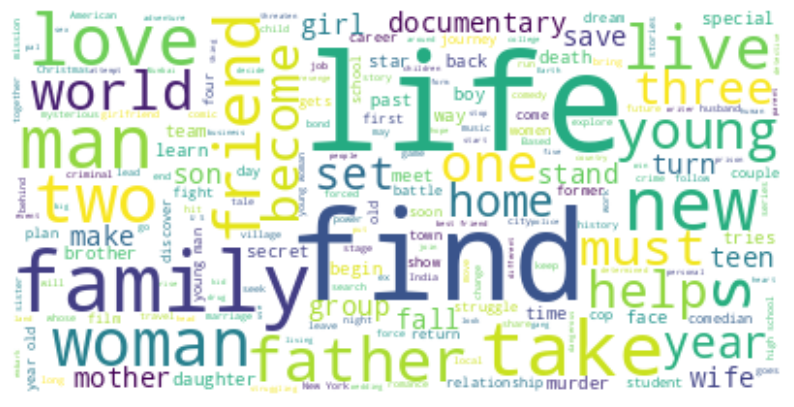

In [62]:
# Using above function to make wordcloud based on Movie type only
func_select_Catagory("Movie", "type", "description")

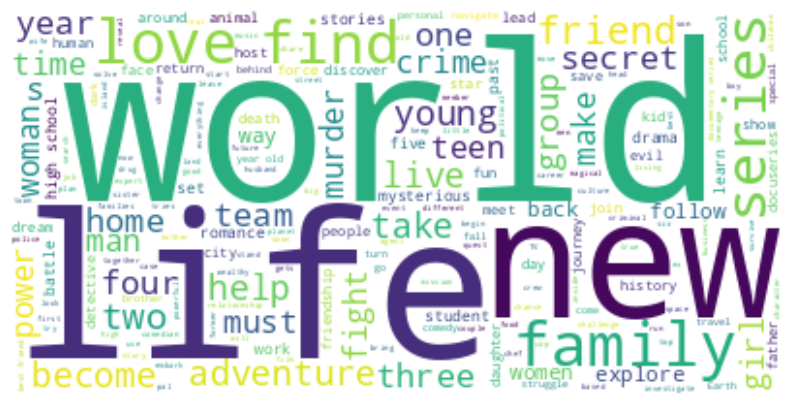

In [63]:
# Using above function to make wordcloud based on TV Show type only
func_select_Catagory("TV Show", "type", "description")

## <B> Bivarient Analysis

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7787 non-null   object        
 6   date_added    7787 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7787 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  Year_added    7787 non-null   int64         
 13  month_added   7787 non-null   int64         
 14  target_ages   7787 non-null   object        
dtypes: datetime64[ns](1), int64(3), object

In [65]:
df["listed_in"]

0       International TV Shows, TV Dramas, TV Sci-Fi &...
1                            Dramas, International Movies
2                     Horror Movies, International Movies
3       Action & Adventure, Independent Movies, Sci-Fi...
4                                                  Dramas
                              ...                        
7782                         Dramas, International Movies
7783       Dramas, International Movies, Music & Musicals
7784    Documentaries, International Movies, Music & M...
7785                   International TV Shows, Reality TV
7786                      Documentaries, Music & Musicals
Name: listed_in, Length: 7787, dtype: object

## <b>  Country v/s Genre

In [66]:
def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""

def preprocess_data(df):
    df['country_list'] = df.apply(lambda x: explode_country(x['country']), axis=1)
    df = df.explode('country_list')
    df['genre_list'] = df.apply(lambda x: explode_country(x['listed_in']), axis=1)
    df = df.explode('genre_list')
    return df

def group_by_country_genre(df):
    grouped_df_ = df.groupby(['country_list', 'genre_list']).agg({'title': 'count'})
    grouped_df = grouped_df_.reset_index()
    grouped_df = grouped_df[grouped_df.country_list != '']
    return grouped_df


In [67]:
df1 = preprocess_data(df)
grouped_df = group_by_country_genre(df1)

In [68]:
grouped_df

,country_list,genre_list,title
0,Afghanistan,Documentaries,1
1,Afghanistan,International Movies,1
2,Albania,Dramas,1
3,Albania,International Movies,1
4,Algeria,Classic Movies,1
...,...,...,...
1347,West Germany,Thrillers,1
1348,Zimbabwe,Comedies,1
1349,Zimbabwe,Documentaries,2
1350,Zimbabwe,International Movies,3


In [69]:
country_list_to_show = ["United States", "India", "United Kingdom", "France", "Canada"]

# list_of_countries = list(set(list(grouped_df['country_list'].values)))
def plot_country_genre_trends(grouped_df):
    list_of_countries = ["United States", "India", "United Kingdom", "France", "Canada"]
    for country in list_of_countries:
        country_df = grouped_df[grouped_df['country_list'] == country].sort_values("title", ascending=False)
        country_df.plot.bar(x="genre_list", y="title", color="skyblue", rot=90, figsize=(9, 5))
        plt.title(f"{country}")
        plt.show()

def get_genre_country_trends(df):
    df = preprocess_data(df)
    grouped_df = group_by_country_genre(df)
    plot_country_genre_trends(grouped_df)
    return grouped_df

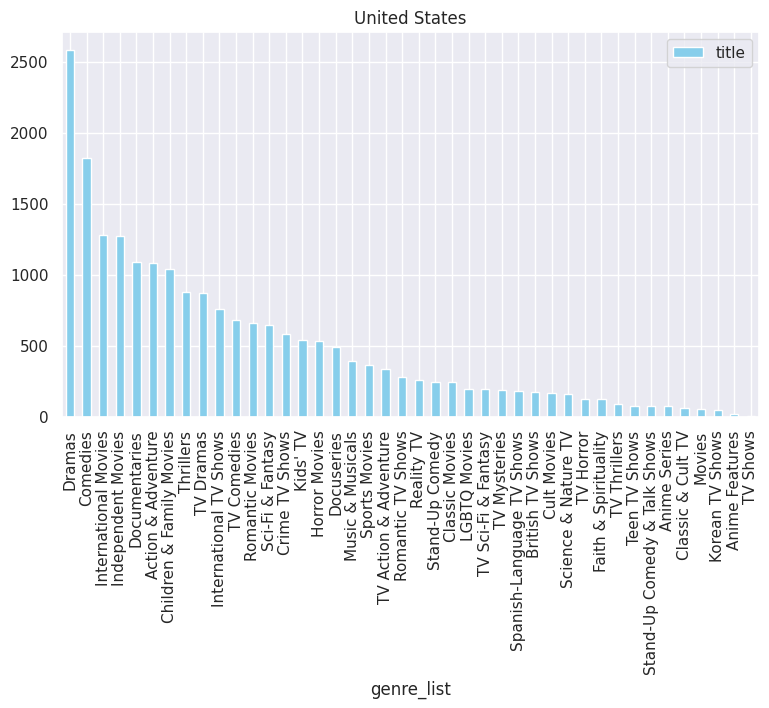

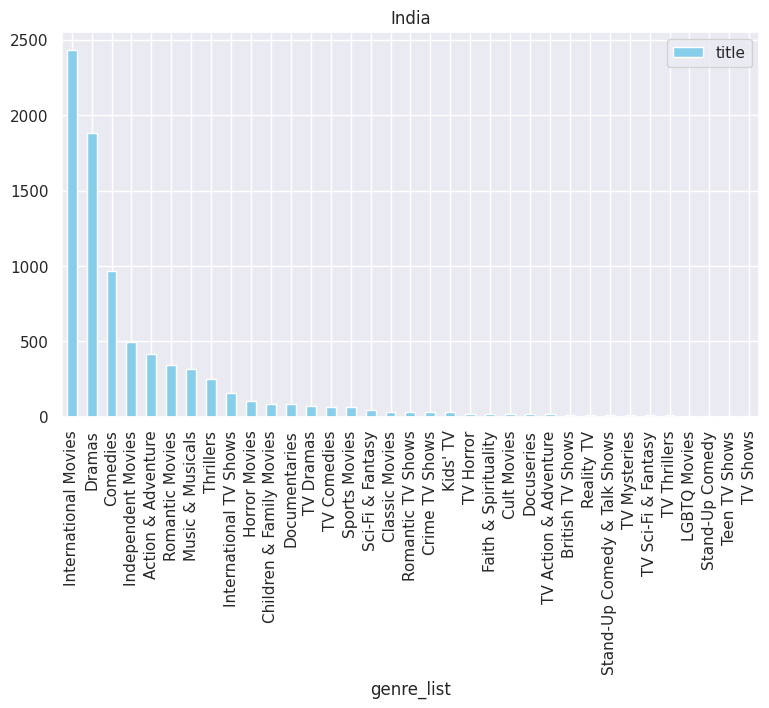

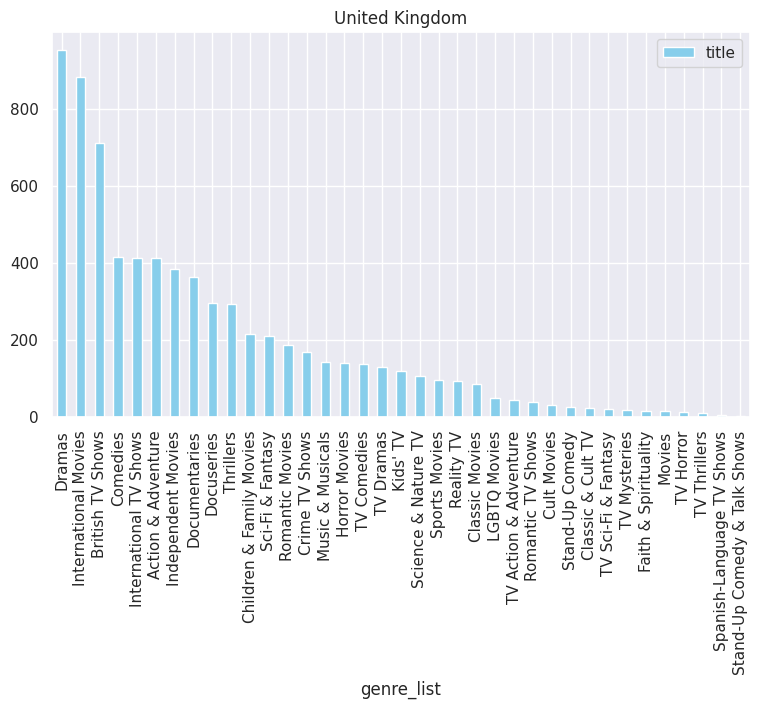

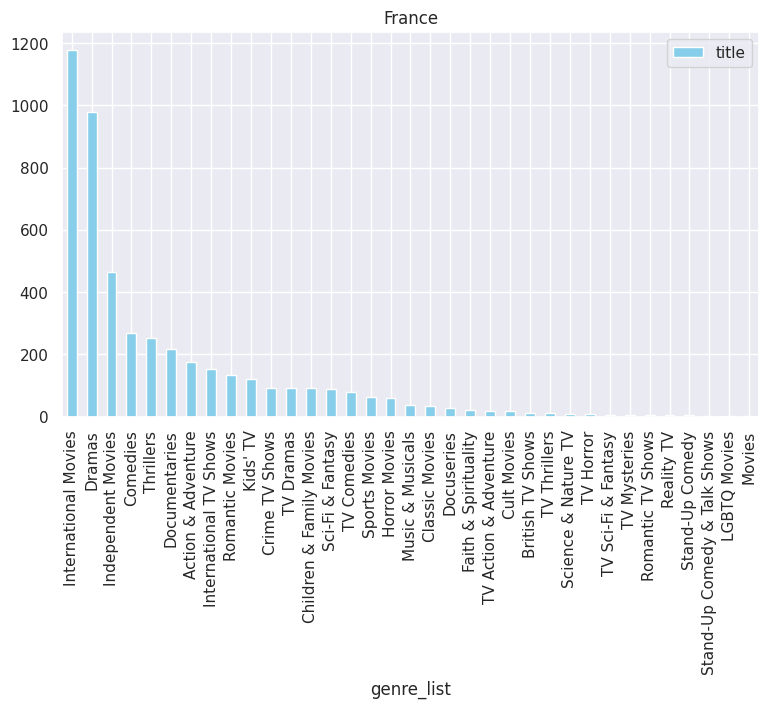

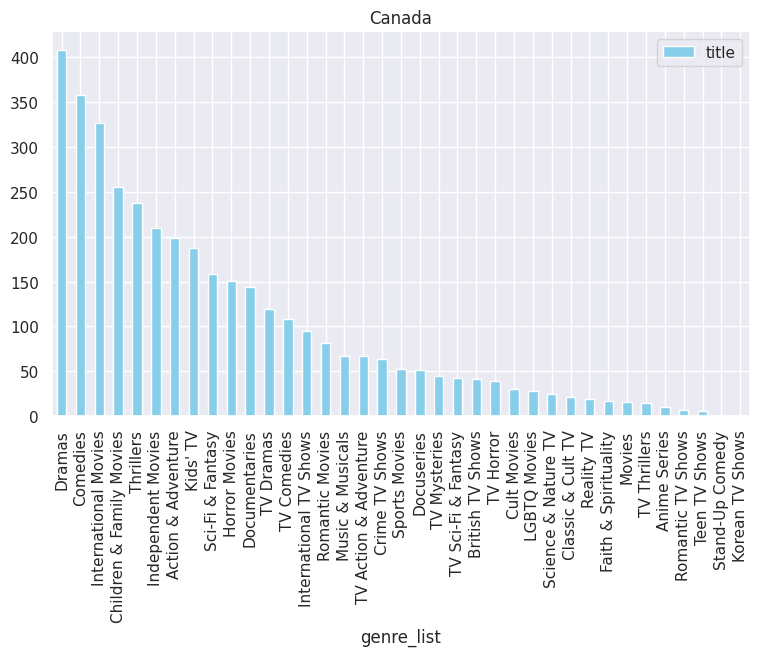

In [70]:
Country_wise_df = get_genre_country_trends(df1)

## we also can visualize the same using wordcloud

In [71]:
def get_word_clouds(grouped_df):
  country_list_to_show = ["United States", "India", "United Kingdom", "France", "Canada"]
  from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
  for each in country_list_to_show:
    text = " ".join(grouped_df[grouped_df["country_list"] == each]["genre_list"])
    plt.rcParams['figure.figsize'] = (10, 10)
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'white', width = 1000,  height = 500, max_words = 121).generate(text)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'Most popular genres for {each}',fontsize = 30)
    plt.show()

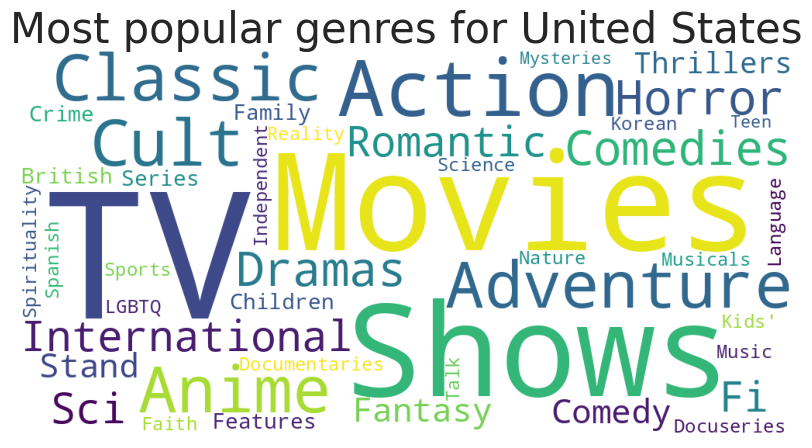

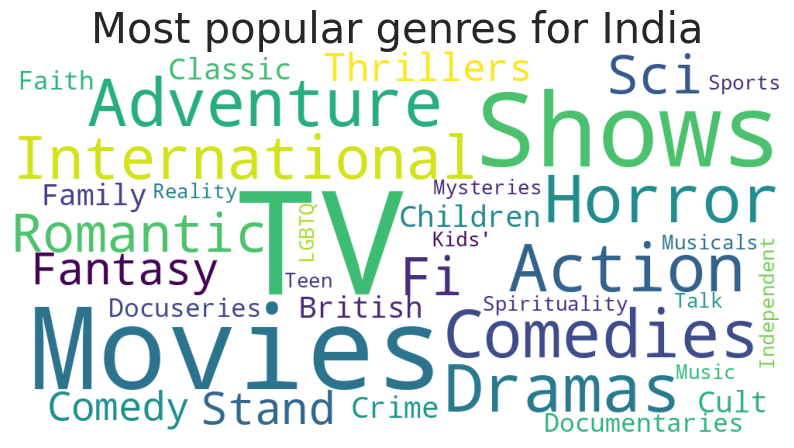

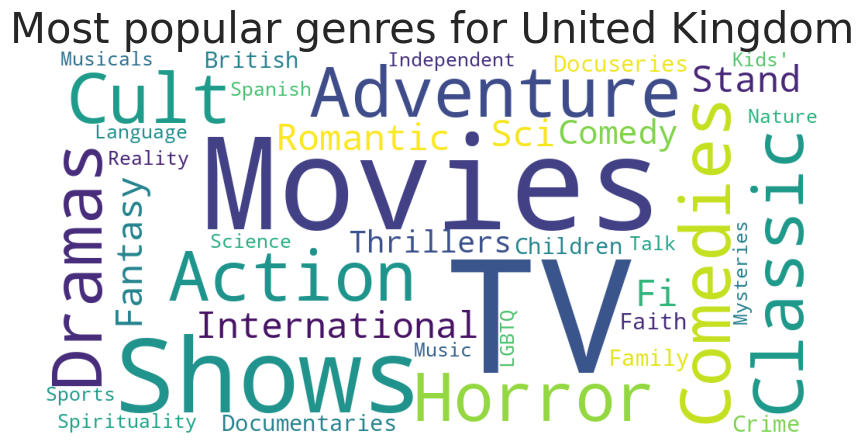

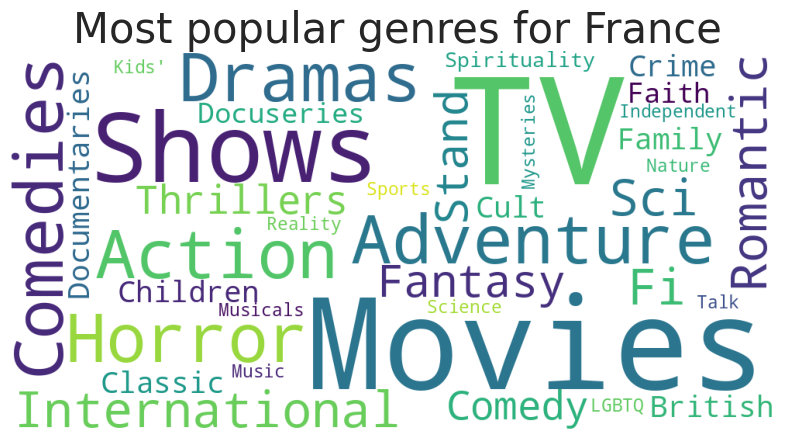

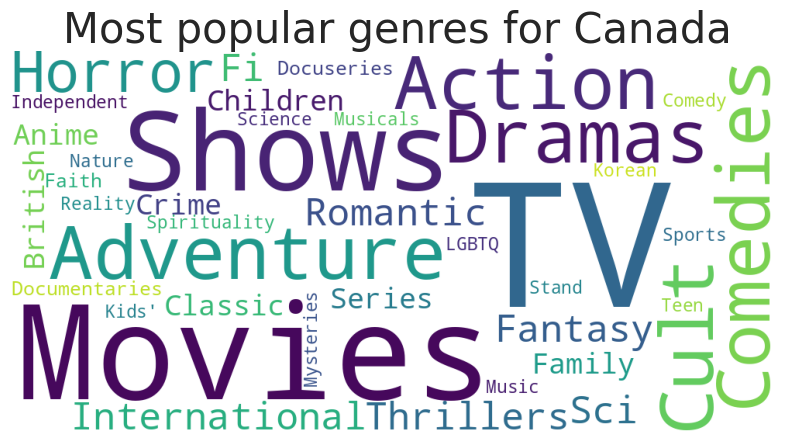

In [72]:
get_word_clouds(grouped_df)

## <b>  Countries

In [73]:
#necessary imports for plotly and map
import pandas as pd
import numpy as np
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots

In [74]:
# all country df
all_countries = df.groupby(['country','type']).count()['show_id'].reset_index()
all_countries.head()

,country,type,show_id
0,Argentina,Movie,34
1,Argentina,TV Show,16
2,"Argentina, Brazil, France, Poland, Germany, De...",Movie,1
3,"Argentina, Chile",Movie,1
4,"Argentina, Chile, Peru",Movie,1


In [75]:
# All country dataframe
all_countries = df.groupby(["country", "type"]).count()['show_id'].reset_index()
all_countries.head()

,country,type,show_id
0,Argentina,Movie,34
1,Argentina,TV Show,16
2,"Argentina, Brazil, France, Poland, Germany, De...",Movie,1
3,"Argentina, Chile",Movie,1
4,"Argentina, Chile, Peru",Movie,1


In [76]:
#country wise content for top countries
country_count = {}
for i in range(len(all_countries)):
    l = all_countries['country'][i].split(', ')
    for x in l:
        x = re.sub('[^A-Za-z0-9 ]+', '', x)
        if x not in country_count.keys():
            country_count[x] = all_countries['show_id'][i]
        else:
            country_count[x] += all_countries['show_id'][i]
country_df = pd.DataFrame(list(zip(country_count.keys(), country_count.values())), columns =['country', 'count']) 

d = country_df.sort_values(by=['count'], ascending=False).head(10)
# .plot.bar(x='country',y='count',edgecolor='black')
fig = px.bar(d, x='country',y='count')
fig.update_traces(marker_color='#221F1F', marker_line_color='#E50914',
                  marker_line_width=2, opacity=1)
fig.update_layout(title='Content produced country wise')
fig.show()
top_30 = country_df.sort_values(by=['count'], ascending=False)['country'].head(30)

In [77]:
# Creating dataframe of Countries and its count based on show_id
import re

country_count = {}

for i in range(len(all_countries)):
    l = all_countries["country"][i].split(", ")
    for x in l:
        x = re.sub("[^A-Za-z0-9]+", " ", x)
        if x not in country_count.keys():
            country_count[x] = all_countries["show_id"][i]
        else:
            country_count[x] += all_countries["show_id"][i]

country_df = pd.DataFrame(list(zip(country_count.keys(), country_count.values())), columns = ["Country", "Count"])

In [78]:
country_df

,Country,Count
0,Argentina,82
1,Brazil,88
2,France,349
3,Poland,35
4,Germany,199
...,...,...
116,Liechtenstein,1
117,Kazakhstan,1
118,Nicaragua,1
119,Venezuela,3


In [79]:
# Ploting the top 10 countries
d = country_df.sort_values(by=['Count'], ascending=False).head(10)
fig = px.bar(d, x='Country',y='Count')
fig.update_traces(marker_color='#221F1F', marker_line_color='#E50914',
                  marker_line_width=2, opacity=1)
fig.update_layout(title='Top 10 Content producing country on Netflix')
fig.show()

## <B> Ploting the same in world map for more visually appealing

In [80]:
#Content wise country representaion
sns.set_theme()
trace = go.Choropleth(
            locations = list(country_count.keys()),
            locationmode='country names',
            z = list(country_count.values()),
            text = country_df['Country'],
            reversescale = False,
            zauto = True,
            colorscale = 'RdBu',
            marker = dict(
                line = dict(
                    color = 'rgb(0,0,0)',
                    width = 0.5)
            ),
            colorbar = dict(
                tickprefix = '')
        )

data = [trace]
layout = go.Layout(
    title = 'Total content per country',
    geo = dict(
        showframe = True,
        showlakes = False,
        showcoastlines = True,
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()

## <B> There is an Hypothesis that Netflix has added more content of Movies than TV Serials over the year.. Lets check this hypothesis now

In [81]:
df.Year_added.nunique()

14

In [82]:
TV_Show_YearWise_df = df[df["type"] == "TV Show"].groupby("Year_added").agg({'show_id': 'count'})
TV_Show_YearWise_df.reset_index(inplace = True)
TV_Show_YearWise_df

,Year_added,show_id
0,2008,1
1,2013,5
2,2014,6
3,2015,30
4,2016,185
5,2017,361
6,2018,430
7,2019,656
8,2020,707
9,2021,29


In [83]:
Movie_YearWise_df = df[df["type"] == "Movie"].groupby("Year_added").agg({'show_id': 'count'})
Movie_YearWise_df.reset_index(inplace = True)
Movie_YearWise_df

,Year_added,show_id
0,2008,1
1,2009,2
2,2010,1
3,2011,13
4,2012,3
5,2013,6
6,2014,19
7,2015,58
8,2016,258
9,2017,864


## Lets Visualise it on plotly

In [84]:
trace1 = go.Scatter(
                    x = TV_Show_YearWise_df["Year_added"], 
                    y = TV_Show_YearWise_df["show_id"], 
                    name="TV Shows", 
                    marker=dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))

trace2 = go.Scatter(
                    x=Movie_YearWise_df["Year_added"], 
                    y=Movie_YearWise_df["show_id"], 
                    name="Movies", 
                    marker= dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(hovermode= 'closest', title = 'Content added over the years' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Count'),template= "plotly_dark")
fig = go.Figure(data = [trace1, trace2], layout=layout)
fig.show()

## Here we can observe that there were more movies added in Netflix than TV shows after 2016

## <b> Text Based Clustering

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7787 non-null   object        
 6   date_added    7787 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7787 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  Year_added    7787 non-null   int64         
 13  month_added   7787 non-null   int64         
 14  target_ages   7787 non-null   object        
 15  country_list  7787 non-null   object  

In [86]:
df.country.sort_values(ascending = False)

1493        Zimbabwe
2757    West Germany
5654         Vietnam
3105         Vietnam
1482         Vietnam
            ...     
5224       Argentina
4220       Argentina
2548       Argentina
3485       Argentina
2449       Argentina
Name: country, Length: 7787, dtype: object

In [87]:
# Replacing No cast from blank so that Word No cast should not influence text based clustering
df["cast"].replace({"No Cast": " "}, inplace=True)
df["director"].replace({"No Director": " "}, inplace=True)

In [88]:
# Appending all text column to single text column
df["single_text_column"] = df["description"] + " "+ df["listed_in"] + " "+ df["rating"] + " "+ df["country"] + " "+ df["cast"] + " "+ df["director"]

In [89]:
# Looking at the first row
df['single_text_column'][0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. International TV Shows, TV Dramas, TV Sci-Fi & Fantasy TV-MA Brazil João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi  '

In [90]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,Year_added,month_added,target_ages,country_list,single_text_column
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,Adults,[Brazil],In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,Adults,[Mexico],After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,Adults,[Singapore],"When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,Teens,[United States],"In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,Teens,[United States],A brilliant group of students become card-coun...


<function matplotlib.pyplot.show(close=None, block=None)>

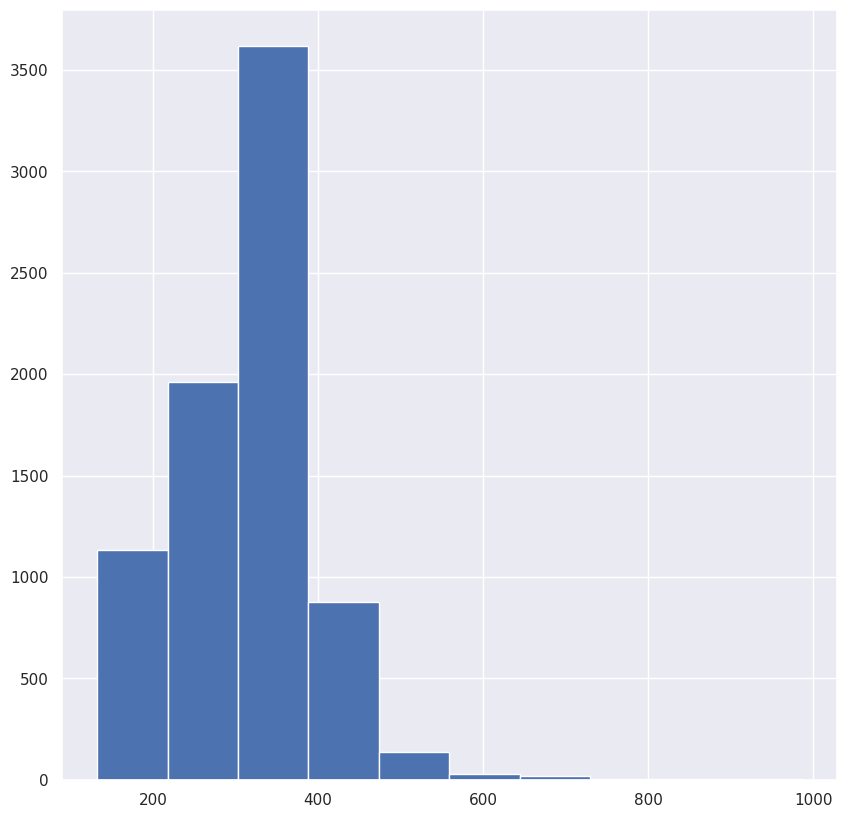

In [91]:
# Checking the lenght of single_text_column
single_text_column_len = [len(str(x)) for x in df["single_text_column"]]
single_text_column_len = np.array(single_text_column_len)
plt.hist(single_text_column_len)
plt.show

## Inference : we can infer from the above chart hat mostly the text in column single_text_column has mode of 300 to 400 length of text (mostly lenght of 300 - 400 size)

## <b> Text Processing

In [92]:
# Text Cleaning
import re
def cleaned(x):
  return re.sub(r"[^a-zA-Z ]","",str(x))

In [93]:
df["single_text_column"] = df["single_text_column"].apply(cleaned)

In [94]:
# Convert everything to lower
df["single_text_column"] = df["single_text_column"].str.lower()

In [95]:
# Import necessary library
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
nltk.download("punkt")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

## <b> Steming : It is a process to reduce the word to its base or root form. e.g The word Running after steming becomes run

In [96]:
# Steming
stemmer = SnowballStemmer("english")
# Stopwords
stop_words = set(stopwords.words("english"))

In [97]:
# Define a function to filter and stem words
def wordfilter(string, filtwords):
    filtered = []
    tokens = word_tokenize(string)
    for word in tokens:
        if word not in filtwords:
            filtered.append(stemmer.stem(word))
    return filtered

# Add a new column 'filtered_new' to the DataFrame
df['filtered_new'] = ''

# Iterate over each row in the DataFrame
for item, row in df.iterrows():
    # Apply word filtering and stemming to the 'filtered' column value of each row
    filtered_words = wordfilter(row['single_text_column'], stop_words)
    # Assign the filtered result to the corresponding row in the 'filtered_new' column
    df.at[item, 'filtered_new'] = filtered_words

# Display the resulting 'filtered_new' column
df['filtered_new']


0       [futur, elit, inhabit, island, paradis, far, c...
1       [devast, earthquak, hit, mexico, citi, trap, s...
2       [armi, recruit, found, dead, fellow, soldier, ...
3       [postapocalypt, world, ragdol, robot, hide, fe...
4       [brilliant, group, student, becom, cardcount, ...
                              ...                        
7782    [lebanon, civil, war, depriv, zozo, famili, he...
7783    [scrappi, poor, boy, worm, way, tycoon, dysfun...
7784    [documentari, south, african, rapper, nasti, c...
7785    [dessert, wizard, adriano, zumbo, look, next, ...
7786    [documentari, delv, mystiqu, behind, bluesrock...
Name: filtered_new, Length: 7787, dtype: object

In [98]:
# Define a function to join words
def join_words(x):
  return " ".join(x)

In [99]:
df['filtered_new'] = df["filtered_new"].apply(join_words)

In [100]:
df['filtered_new']

0       futur elit inhabit island paradis far crowd sl...
1       devast earthquak hit mexico citi trap survivor...
2       armi recruit found dead fellow soldier forc co...
3       postapocalypt world ragdol robot hide fear dan...
4       brilliant group student becom cardcount expert...
                              ...                        
7782    lebanon civil war depriv zozo famili hes left ...
7783    scrappi poor boy worm way tycoon dysfunct fami...
7784    documentari south african rapper nasti c hit s...
7785    dessert wizard adriano zumbo look next willi w...
7786    documentari delv mystiqu behind bluesrock trio...
Name: filtered_new, Length: 7787, dtype: object

In [101]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,Year_added,month_added,target_ages,country_list,single_text_column,filtered_new
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,Adults,[Brazil],in a future where the elite inhabit an island ...,futur elit inhabit island paradis far crowd sl...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,Adults,[Mexico],after a devastating earthquake hits mexico cit...,devast earthquak hit mexico citi trap survivor...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,Adults,[Singapore],when an army recruit is found dead his fellow ...,armi recruit found dead fellow soldier forc co...
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,Teens,[United States],in a postapocalyptic world ragdoll robots hide...,postapocalypt world ragdol robot hide fear dan...
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,Teens,[United States],a brilliant group of students become cardcount...,brilliant group student becom cardcount expert...


In [102]:
words = df.filtered_new

### <B>  TF- IDF Vectorization

In [146]:
#Implementing TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
t_vectorizer = TfidfVectorizer(max_df = 0.9, min_df = .01, max_features = 15000)
x = t_vectorizer.fit_transform(words)

## <b> Lets do PCA for Dimantionality Reduction

In [147]:
# implementing PCA
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
transformer = PCA()
transformer.fit(x.toarray())

PCA()

Text(0, 0.5, 'cumulative explained variance')

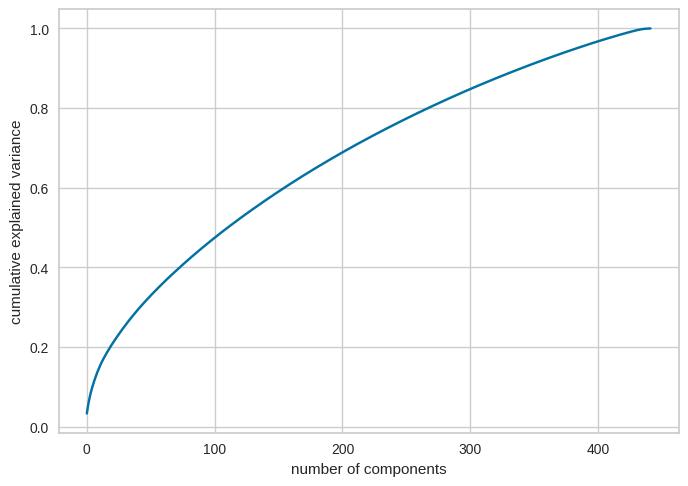

In [148]:
#explained var v/s comp
plt.plot(np.cumsum(transformer.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

## Inferance : 82% of the varience will be covered by 300 components

## Hence choosing 300 compenents and rerunning the PCA again

In [149]:
# Choosing the right dimention from plot for n_components = 8
transformer = PCA(n_components = 300)
transformer.fit(x.toarray())
x_transformed = transformer.transform(x.toarray())
x_transformed.shape

(7787, 300)

In [150]:
# Vectorizing the test and train
x_vectorized = t_vectorizer.transform(words)

In [151]:
#applying pca
X= transformer.transform(x_vectorized.toarray())

In [152]:
X

array([[ 0.25391543,  0.04334851, -0.02142324, ..., -0.00136652,
         0.0410245 ,  0.0118872 ],
       [-0.07640668,  0.09850619,  0.01892808, ..., -0.02867281,
        -0.04685133,  0.02488736],
       [-0.10740429,  0.11010101, -0.02684577, ...,  0.05113543,
        -0.00477405,  0.06684527],
       ...,
       [-0.17742386, -0.14065845,  0.50518644, ...,  0.00642705,
        -0.00608259,  0.02033524],
       [ 0.24853886, -0.00229375,  0.06694438, ...,  0.07896288,
         0.00900898,  0.06920528],
       [-0.17919516, -0.27866703,  0.49998258, ..., -0.01235384,
        -0.00970391,  0.0308617 ]])

## K Mean Clustering

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

KElbowVisualizer(ax=<Axes: >, estimator=KMeans(n_clusters=19), k=(4, 20),
                 metric='silhouette', timings=False)

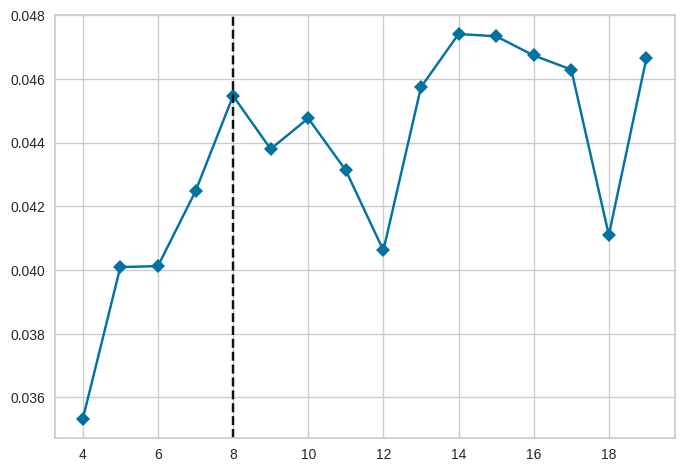

In [153]:
# Sample code to run the KElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(
    model, k=(4,20), metric='silhouette', timings=False
)

visualizer.fit(X)   

## <b> Inference : It suggest to make optimum 8 cluster based on k-means model

## <b> Let select optimum value of cluster as 14

In [154]:
# fitting the k means algorithm on lower features

kmeans= KMeans(n_clusters = 14, init= 'k-means++',max_iter=500, n_init=1)
kmeans.fit(X)

KMeans(max_iter=500, n_clusters=14, n_init=1)

In [155]:
from sklearn.metrics import silhouette_score
print("Silhouette Coefficient:  %0.3f"%silhouette_score(X, kmeans.labels_))

Silhouette Coefficient:  0.043


In [156]:
#predict the labels of clusters.
label = kmeans.fit_predict(X)

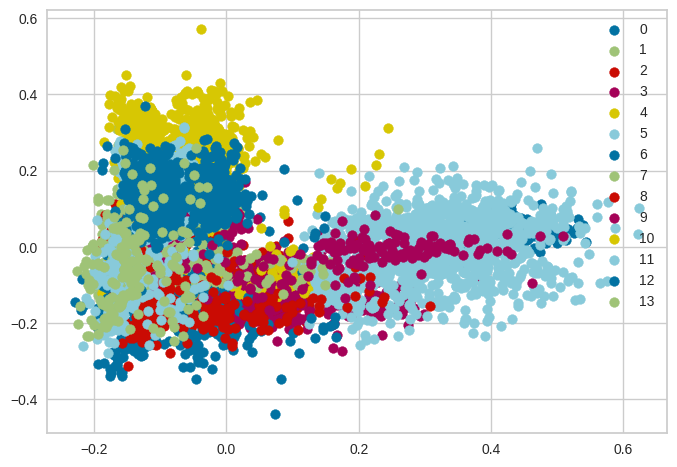

In [157]:
#Getting unique labels
u_labels = np.unique(label)
 
#plotting the results:
for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

## <B> Labelling the Cluster

In [158]:
# kmeans label to cluster column
df['cluster'] = kmeans.labels_

In [159]:
df.cluster.value_counts()

5     1196
2     1095
12     899
10     711
4      613
6      555
7      526
1      479
3      473
8      366
11     335
9      197
0      179
13     163
Name: cluster, dtype: int64

In [160]:
df.head(10)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,Year_added,month_added,target_ages,country_list,single_text_column,filtered_new,cluster
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,Adults,[Brazil],in a future where the elite inhabit an island ...,futur elit inhabit island paradis far crowd sl...,5
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,Adults,[Mexico],after a devastating earthquake hits mexico cit...,devast earthquak hit mexico citi trap survivor...,12
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,Adults,[Singapore],when an army recruit is found dead his fellow ...,armi recruit found dead fellow soldier forc co...,7
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,Teens,[United States],in a postapocalyptic world ragdoll robots hide...,postapocalypt world ragdol robot hide fear dan...,4
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,Teens,[United States],a brilliant group of students become cardcount...,brilliant group student becom cardcount expert...,2
5,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2017-07-01,2016,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",A genetics professor experiments with a treatm...,2017,7,Adults,[Turkey],a genetics professor experiments with a treatm...,genet professor experi treatment comatos siste...,5
6,s7,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,2020-06-01,2019,TV-MA,95 min,"Horror Movies, International Movies","After an awful accident, a couple admitted to ...",2020,6,Adults,[Egypt],after an awful accident a couple admitted to a...,aw accid coupl admit grisli hospit separ must ...,12
7,s8,Movie,187,Kevin Reynolds,"Samuel L. Jackson, John Heard, Kelly Rowan, Cl...",United States,2019-11-01,1997,R,119 min,Dramas,After one of his high school students attacks ...,2019,11,Adults,[United States],after one of his high school students attacks ...,one high school student attack dedic teacher t...,2
8,s9,Movie,706,Shravan Kumar,"Divya Dutta, Atul Kulkarni, Mohan Agashe, Anup...",India,2019-04-01,2019,TV-14,118 min,"Horror Movies, International Movies","When a doctor goes missing, his psychiatrist w...",2019,4,Teens,[India],when a doctor goes missing his psychiatrist wi...,doctor goe miss psychiatrist wife treat bizarr...,10
9,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,2017-12-15,2008,TV-MA,143 min,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...,2017,12,Adults,[India],an architect and his wife move into a castle t...,architect wife move castl slate becom luxuri h...,10


### We can use previously created function named "func_select_Catagory" to make world cloud based on different cluster

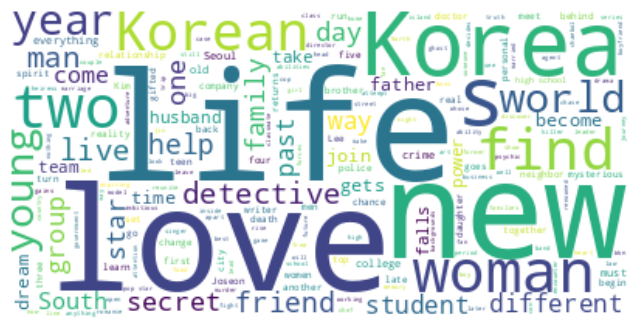

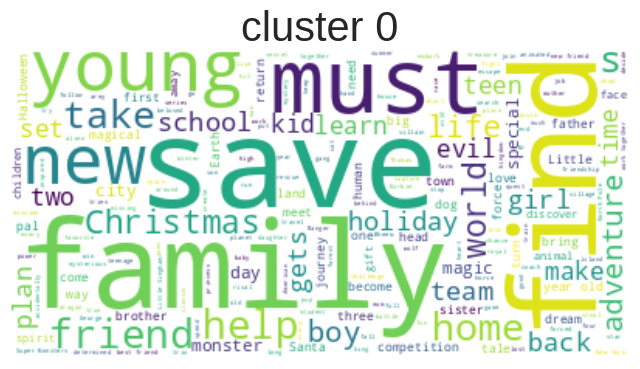

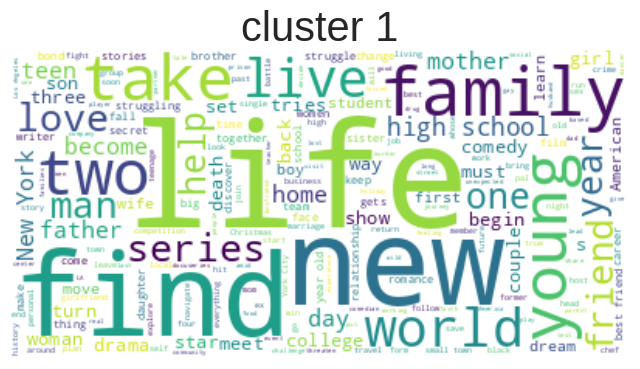

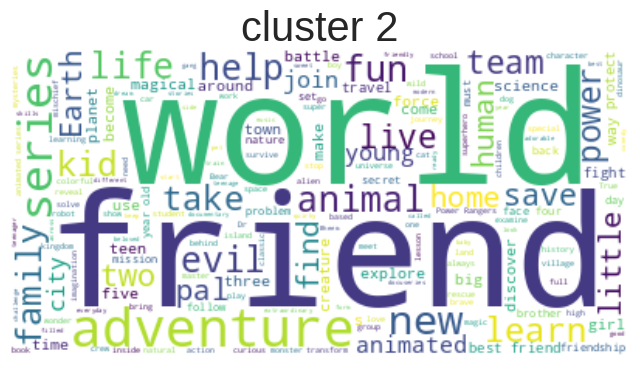

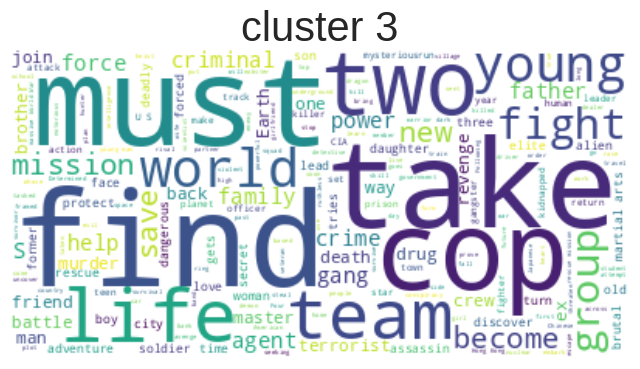

...

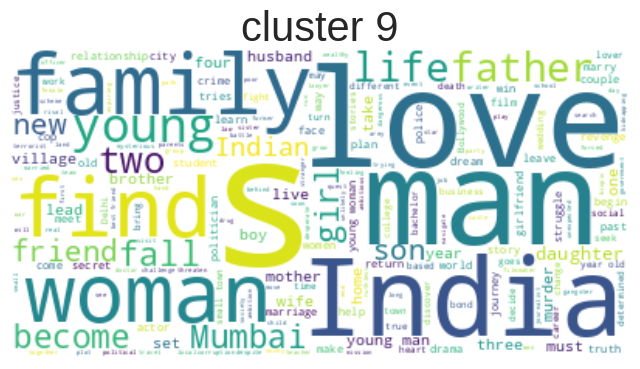

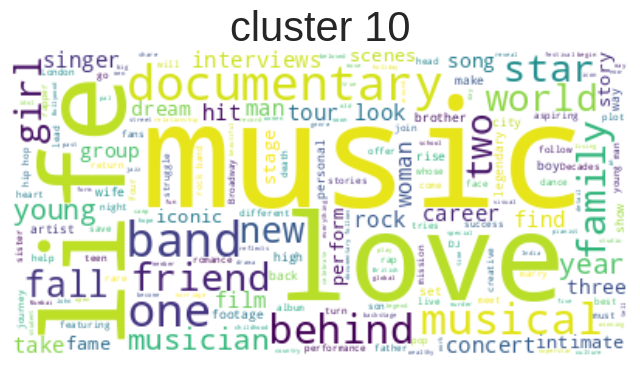

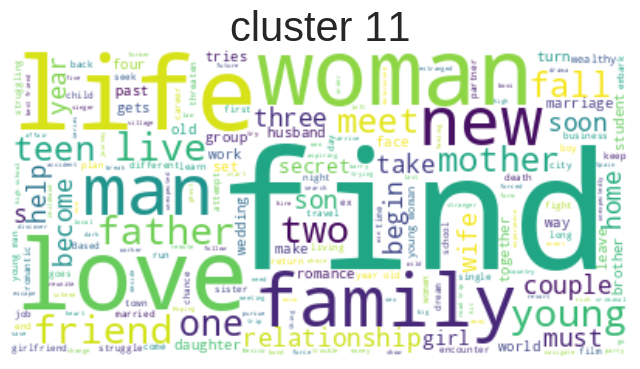

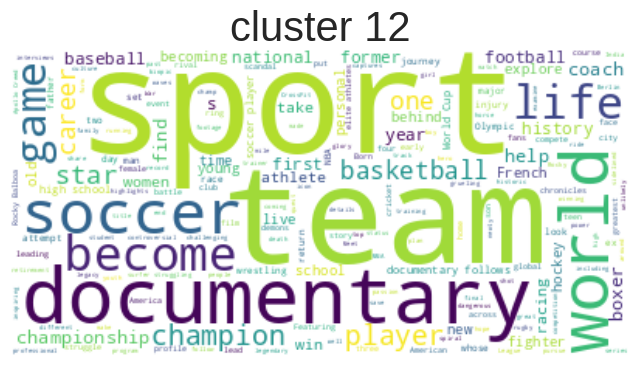

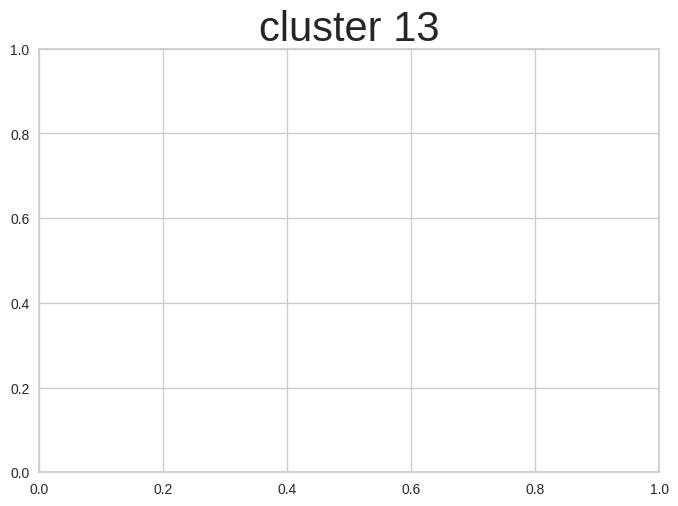

In [162]:
for i in range(14):
  func_select_Category(i,'cluster','description')
  plt.title(f"cluster {i}", fontsize=30)

## Lets make cluster based on Listed_i(genre)

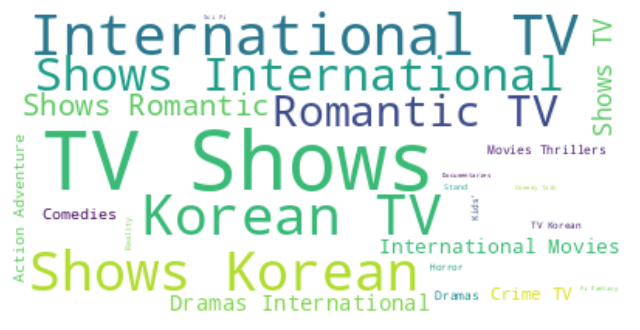

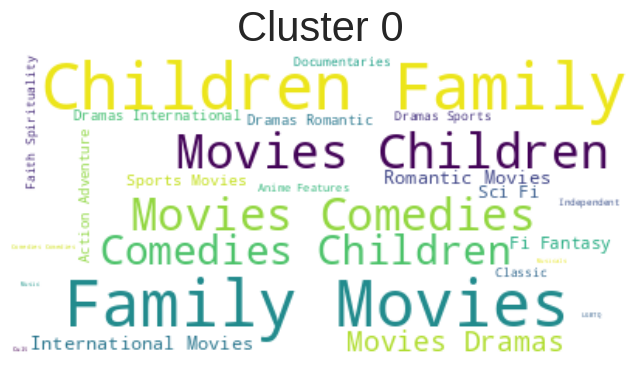

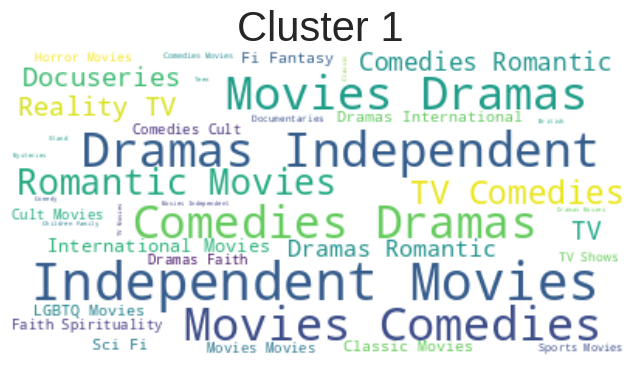

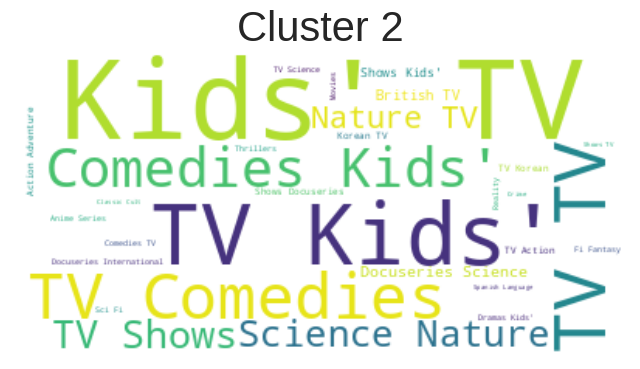

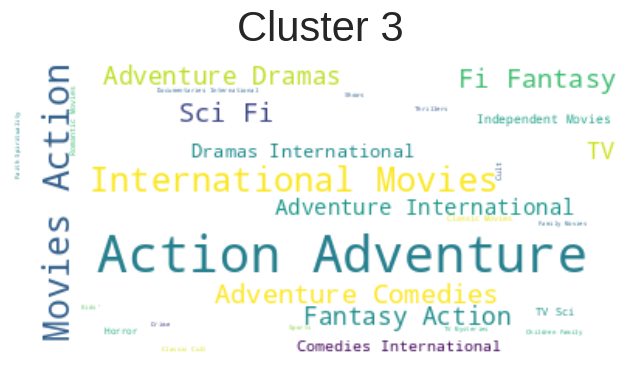

...

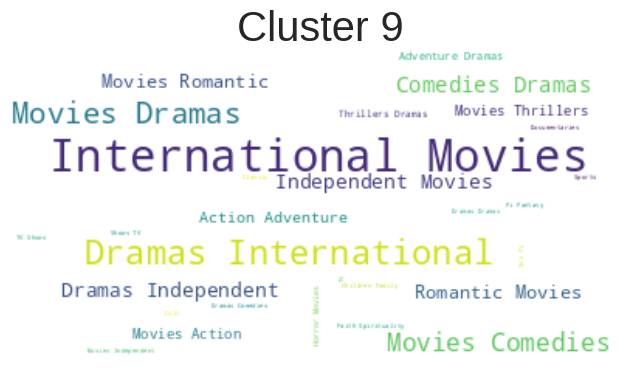

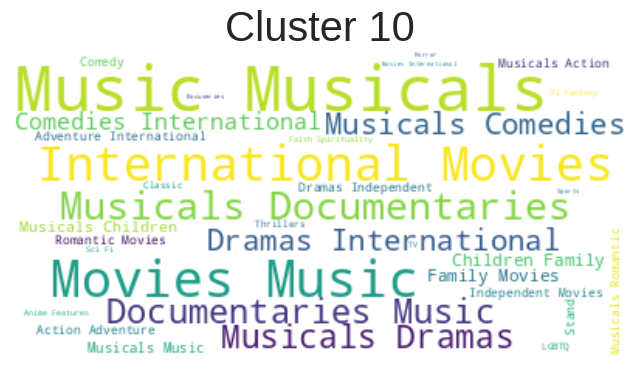

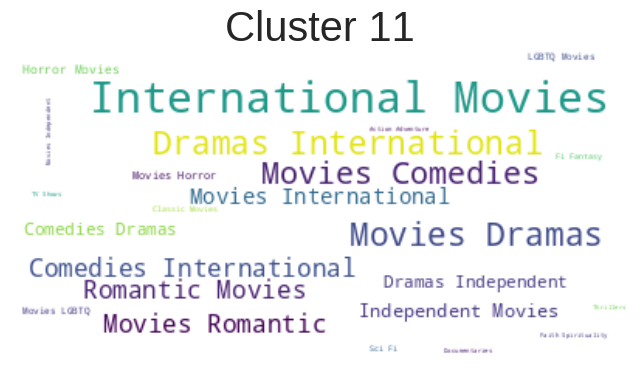

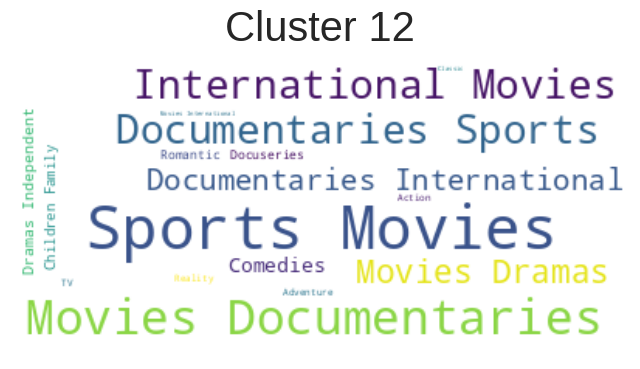

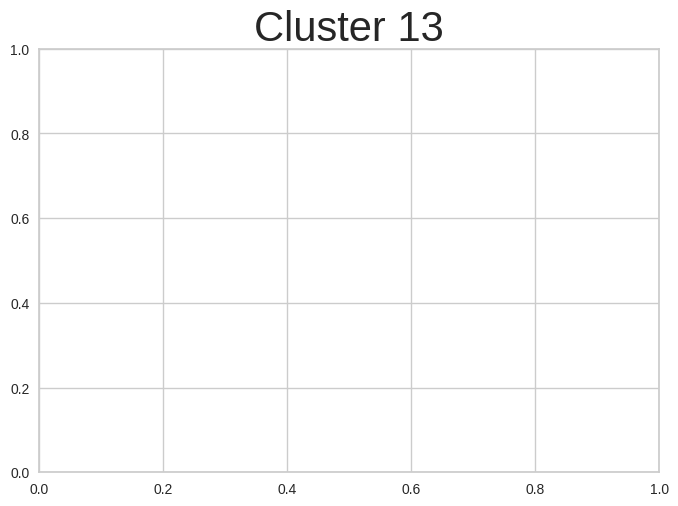

In [164]:
for i in range(14):
  func_select_Category(i,'cluster','listed_in')
  plt.title(f'Cluster {i}', fontsize = 30)

## We can name each cluster based on WordCloud on Description suggestion

## <b>  Cluster 0 : Life/Love/Korean Stories

In [210]:
df[df["cluster"] == 0][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
51,TV Show,100 Days My Prince,,"Doh Kyung-soo, Nam Ji-hyun, Cho Seong-ha, Cho ...",South Korea,TV-14,"International TV Shows, Romantic TV Shows, TV ...","Upon losing his memory, a crown prince encount..."
61,TV Show,12 Years Promise,,"So-yeon Lee, Namkoong Min, Tae-im Lee, So-hui ...",South Korea,TV-14,"International TV Shows, Korean TV Shows, Roman...",A pregnant teen is forced by her family to lea...
91,Movie,26 Years,Geun-hyun Cho,"Goo Jin, Hye-jin Han, Soo-bin Bae, Seul-ong Im...",South Korea,TV-MA,"Dramas, International Movies, Thrillers",Twenty-six years after the 1980 massacre at Gw...
95,TV Show,28 Moons,,"Jin-sung Yang, Kyu-jong Kim, Tae-hwan Kang, Ge...",South Korea,TV-PG,"International TV Shows, Korean TV Shows, Roman...",When her fiancé acts strangely upon receiving ...
191,TV Show,A Korean Odyssey,,"Lee Seung-gi, Cha Seung-won, Oh Yeon-seo, Lee ...",South Korea,TV-MA,"International TV Shows, Korean TV Shows, Roman...",A self-serving mythical creature's bid for inv...
...,...,...,...,...,...,...,...,...
7486,TV Show,Was It Love?,,"Song Ji-hyo, Son Ho-jun, Song Jong-ho, Koo Ja-...",South Korea,TV-14,"International TV Shows, Korean TV Shows, Roman...",When four very different men appear in her lif...
7555,TV Show,What in the World Happened?,,"Eun-mi Go, Jaehyo, Eun-Hyung Jo, Ha-yeon Kim, ...",South Korea,TV-14,"International TV Shows, Korean TV Shows, Roman...",A happy secret romance between a 40-year-old w...
7583,TV Show,When the Camellia Blooms,,"Kong Hyo-jin, Kang Ha-neul, Kim Ji-seok, Oh Ju...",South Korea,TV-14,"International TV Shows, Korean TV Shows, Roman...",Dongbaek is a single mother. When a potential ...
7601,TV Show,White Nights,,"Yo-Won Lee, Goo Jin, U-ie, Hae-in Jung, Gook-h...",South Korea,TV-14,"International TV Shows, Korean TV Shows, TV Dr...","A coldhearted heiress, a man from her past and..."


## <b> Cluster 1: Comedies/Drama

In [211]:
df[df["cluster"] == 1][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
113,Movie,48 Christmas Wishes,"Marco Deufemia, Justin G. Dyck","Khiyla Aynne, Noah Dyer, Maya Franzoi, Clara K...",Canada,TV-G,"Children & Family Movies, Comedies",When a small town's letters to Santa accidenta...
145,Movie,A 2nd Chance,Clay Glen,"Nina Pearce, Adam Tuominen, Emily Morris, Amy ...",Australia,PG,"Children & Family Movies, Dramas, Sports Movies",A gymnast lacks the confidence she needs to re...
147,Movie,A Babysitter's Guide to Monster Hunting,Rachel Talalay,"Tamara Smart, Oona Laurence, Tom Felton, Troy ...",United States,TV-PG,Children & Family Movies,"Recruited by a secret society of babysitters, ..."
155,Movie,A Champion Heart,David de Vos,"Mandy Grace, David de Vos, Donna Rusch, Devan ...",United States,G,"Children & Family Movies, Dramas",When a grieving teen must work off her debt to...
159,Movie,A Christmas Prince,Alex Zamm,"Rose McIver, Ben Lamb, Alice Krige, Honor Knea...",United States,TV-PG,"Children & Family Movies, Dramas, Romantic Movies",Christmas comes early for an aspiring young jo...
...,...,...,...,...,...,...,...,...
7745,Movie,"Yours, Mine and Ours",Raja Gosnell,"Dennis Quaid, Rene Russo, Sean Faris, Katija P...",United States,PG,"Children & Family Movies, Comedies",When a father of eight and a mother of 10 prep...
7761,Movie,Zapped,Peter DeLuise,"Zendaya, Chanelle Peloso, Spencer Boldman, Emi...","Canada, United States",TV-Y,"Children & Family Movies, Comedies",A girl discovers a dog-training app that can g...
7772,Movie,Zipi & Zape y la Isla del Capitan,Oskar Santos,"Teo Planell, Toni Gómez, Elena Anaya, Iria Cas...",Spain,TV-PG,"Children & Family Movies, Comedies","At Christmas, Zip and Zap take a trip with the..."
7776,Movie,Zokkomon,Satyajit Bhatkal,"Darsheel Safary, Anupam Kher, Manjari Fadnis, ...",India,PG,"Children & Family Movies, Dramas","When his cruel uncle abandons him, a young orp..."


## <b> Cluster 2 : Reality TV/Drama

In [212]:
df[df["cluster"] == 2][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
4,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,PG-13,Dramas,A brilliant group of students become card-coun...
7,Movie,187,Kevin Reynolds,"Samuel L. Jackson, John Heard, Kelly Rowan, Cl...",United States,R,Dramas,After one of his high school students attacks ...
26,TV Show,(Un)Well,,,United States,TV-MA,Reality TV,This docuseries takes a deep dive into the luc...
29,TV Show,#blackAF,,"Kenya Barris, Rashida Jones, Iman Benson, Genn...",United States,TV-MA,TV Comedies,Kenya Barris and his family navigate relations...
33,Movie,#realityhigh,Fernando Lebrija,"Nesta Cooper, Kate Walsh, John Michael Higgins...",United States,TV-14,Comedies,When nerdy high schooler Dani finally attracts...
...,...,...,...,...,...,...,...,...
7735,TV Show,Young & Hungry,,"Emily Osment, Kym Whitley, Rex Lee, Jonathan S...",United States,TV-14,TV Comedies,A female food blogger is hired as a personal c...
7736,Movie,Young Adult,Jason Reitman,"Charlize Theron, Patton Oswalt, Patrick Wilson...",United States,R,"Comedies, Dramas, Independent Movies",When a divorced writer gets a letter from an o...
7739,Movie,Your Excellency,Funke Akindele,"Akin Lewis, Funke Akindele, Kemi Lala Akindoju...",United States,TV-G,"Comedies, International Movies","Bumbling through politics, a billionaire busin..."
7758,Movie,Zack and Miri Make a Porno,Kevin Smith,"Seth Rogen, Elizabeth Banks, Craig Robinson, J...",United States,R,"Comedies, Independent Movies, Romantic Movies",Zack and Miri make and star in an adult film t...


## <b> Cluster 3 : Kids TV



In [213]:
df[df["cluster"] == 3][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
53,TV Show,100 Humans,,"Zainab Johnson, Sammy Obeid, Alie Ward",United States,TV-14,"Docuseries, Science & Nature TV",One hundred hardy souls from diverse backgroun...
108,TV Show,3Below: Tales of Arcadia,,"Tatiana Maslany, Diego Luna, Nick Offerman, Ni...",United States,TV-Y7,"Kids' TV, TV Action & Adventure, TV Sci-Fi & F...","After crash-landing on Earth, two royal teen a..."
111,TV Show,44 Cats,,"Sarah Natochenny, Suzy Myers, Simona Berman, E...",Italy,TV-Y7,Kids' TV,Paw-esome tales abound when singing furry frie...
137,TV Show,72 Cutest Animals,,,Australia,TV-PG,"Docuseries, International TV Shows, Science & ...",This series examines the nature of cuteness an...
140,TV Show,72 Dangerous Places to Live,,Mitch Ryan,Australia,TV-PG,"Docuseries, International TV Shows, Science & ...","Get up close and personal with avalanches, fie..."
...,...,...,...,...,...,...,...,...
7720,TV Show,YooHoo to the Rescue,,"Kira Buckland, Ryan Bartley, Bryce Papenbrook,...",South Korea,TV-Y,"Kids' TV, Korean TV Shows","In a series of magical missions, quick-witted ..."
7730,TV Show,You vs. Wild,,Bear Grylls,United States,TV-PG,"Kids' TV, Reality TV, Science & Nature TV","In this interactive series, you'll make key de..."
7759,TV Show,Zak Storm,,"Michael Johnston, Jessica Gee-George, Christin...","United States, France, South Korea, Indonesia",TV-Y7,Kids' TV,Teen surfer Zak Storm is mysteriously transpor...
7766,TV Show,Zig & Sharko,,,France,TV-Y7,"Kids' TV, TV Comedies","Zig, an island-bound hyena, will do anything t..."


## <b> Cluster 4 : Action & Adventure

In [214]:
df[df["cluster"] == 4][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
3,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,PG-13,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
44,Movie,Æon Flux,Karyn Kusama,"Charlize Theron, Marton Csokas, Jonny Lee Mill...",United States,PG-13,"Action & Adventure, Sci-Fi & Fantasy","Aiming to hasten an uprising, the leader of an..."
50,Movie,"10,000 B.C.",Roland Emmerich,"Steven Strait, Camilla Belle, Cliff Curtis, Jo...","United States, South Africa",PG-13,Action & Adventure,Fierce mammoth hunter D'Leh sets out on an imp...
68,Movie,14 Blades,Daniel Lee,"Donnie Yen, Zhao Wei, Wu Chun, Law Kar-Ying, K...","Hong Kong, China, Singapore",R,"Action & Adventure, International Movies","In the age of the Ming Dynasty, Quinglong is t..."
71,Movie,16 Blocks,Richard Donner,"Bruce Willis, Mos Def, David Morse, Jenna Ster...","United States, Germany",PG-13,Action & Adventure,Tasked with escorting a prosecution witness to...
...,...,...,...,...,...,...,...,...
7688,Movie,XXx,Rob Cohen,"Vin Diesel, Asia Argento, Marton Csokas, Samue...",United States,PG-13,"Action & Adventure, Sports Movies",A notorious underground rush-seeker deemed unt...
7689,Movie,XXX: State of the Union,Lee Tamahori,"Ice Cube, Samuel L. Jackson, Willem Dafoe, Sco...",United States,PG-13,Action & Adventure,"In this action-packed follow-up to XXX, U.S. i..."
7728,Movie,You Don't Mess with the Zohan,Dennis Dugan,"Adam Sandler, John Turturro, Emmanuelle Chriqu...",United States,UR,"Action & Adventure, Comedies",An Israeli counterterrorism soldier with a sec...
7737,Movie,Young Tiger,Mu Chu,"Qiu Yuen, Charlie Chin, Jackie Chan, Hu Chin, ...",Hong Kong,NR,"Action & Adventure, International Movies","Aided only by a tough female police officer, a..."


## <b> Cluster 5 : International/Sci-Fiction

In [215]:
df[df["cluster"] == 5][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
0,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,TV-MA,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
5,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,TV-MA,"International TV Shows, TV Dramas, TV Mysteries",A genetics professor experiments with a treatm...
11,TV Show,1983,,"Robert Więckiewicz, Maciej Musiał, Michalina O...","Poland, United States",TV-MA,"Crime TV Shows, International TV Shows, TV Dramas","In this dark alt-history thriller, a naïve law..."
12,TV Show,1994,Diego Enrique Osorno,,Mexico,TV-MA,"Crime TV Shows, Docuseries, International TV S...",Archival video and new interviews examine Mexi...
16,TV Show,Feb-09,,"Shahd El Yaseen, Shaila Sabt, Hala, Hanadi Al-...",United States,TV-14,"International TV Shows, TV Dramas","As a psychology professor faces Alzheimer's, h..."
...,...,...,...,...,...,...,...,...
7746,TV Show,دفعة القاهرة,,"Bashar al-Shatti, Fatima Al Safi, Maram Baloch...",United States,TV-14,"International TV Shows, TV Dramas",A group of women leaves Kuwait to attend unive...
7752,TV Show,Yummy Mummies,,"Lorinska Merrington, Jane Scandizzo, Rachel Wa...",Australia,TV-MA,"International TV Shows, Reality TV",It's drama Down Under when expectant mothers w...
7753,TV Show,Yunus Emre,,"Gökhan Atalay, Payidar Tüfekçioglu, Baran Akbu...",Turkey,TV-PG,"International TV Shows, TV Dramas","During the Mongol invasions, Yunus Emre leaves..."
7767,TV Show,Zindagi Gulzar Hai,,"Sanam Saeed, Fawad Khan, Ayesha Omer, Mehreen ...",Pakistan,TV-PG,"International TV Shows, Romantic TV Shows, TV ...","Strong-willed, middle-class Kashaf and carefre..."


## <b> Cluster 6 : Documentary

In [216]:
df[df["cluster"] == 6][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
25,Movie,(T)ERROR,"Lyric R. Cabral, David Felix Sutcliffe",,United States,NR,Documentaries,This real-life look at FBI counterterrorism op...
28,Movie,#AnneFrank - Parallel Stories,"Sabina Fedeli, Anna Migotto","Helen Mirren, Gengher Gatti",Italy,TV-14,"Documentaries, International Movies","Through her diary, Anne Frank's story is retol..."
30,Movie,#cats_the_mewvie,Michael Margolis,,Canada,TV-14,"Documentaries, International Movies",This pawesome documentary explores how our fel...
52,Movie,100 Days Of Solitude,,,Spain,TV-MA,"Documentaries, International Movies",Spanish photographer José Díaz spends 100 days...
56,Movie,100 Years: One Woman's Fight for Justice,Melinda Janko,,United States,TV-14,Documentaries,This documentary chronicles Elouise Cobell's l...
...,...,...,...,...,...,...,...,...
7633,Movie,Winnie,Pascale Lamche,,"France, Netherlands, South Africa, Finland",TV-14,"Documentaries, International Movies",Winnie Mandela speaks about her extraordinary ...
7636,Movie,Winter on Fire: Ukraine's Fight for Freedom,Evgeny Afineevsky,,"United Kingdom, Ukraine, United States",TV-MA,"Documentaries, International Movies","Over 93 days in Ukraine, what started as peace..."
7647,Movie,Without Gorky,Cosima Spender,,United Kingdom,TV-14,Documentaries,A filmmaker trains the camera on her own famil...
7679,Movie,WWII: Report from the Aleutians,John Huston,,United States,TV-PG,Documentaries,Filmmaker John Huston narrates this Oscar-nomi...


## <b> Cluster 7 : Horror/Thriller

In [217]:
df[df["cluster"] == 7][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
2,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,R,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
10,Movie,1922,Zak Hilditch,"Thomas Jane, Molly Parker, Dylan Schmid, Kaitl...",United States,TV-MA,"Dramas, Thrillers",A farmer pens a confession admitting to his wi...
14,Movie,3022,John Suits,"Omar Epps, Kate Walsh, Miranda Cosgrove, Angus...",United States,R,"Independent Movies, Sci-Fi & Fantasy, Thrillers",Stranded when the Earth is suddenly destroyed ...
15,Movie,Oct-01,Kunle Afolayan,"Sadiq Daba, David Bailie, Kayode Olaiya, Kehin...",Nigeria,TV-14,"Dramas, International Movies, Thrillers",Against the backdrop of Nigeria's looming inde...
17,Movie,22-Jul,Paul Greengrass,"Anders Danielsen Lie, Jon Øigarden, Jonas Stra...","Norway, Iceland, United States",R,"Dramas, Thrillers","After devastating terror attacks in Norway, a ..."
...,...,...,...,...,...,...,...,...
7729,Movie,You Get Me,Brent Bonacorso,"Bella Thorne, Halston Sage, Taylor John Smith,...",United States,TV-MA,"Dramas, Thrillers","After a one-night stand, Holly develops a dang..."
7742,Movie,Your Son,Miguel Ángel Vivas,"José Coronado, Ana Wagener, Asia Ortega, Pol M...","Spain, France",TV-MA,"Dramas, International Movies, Thrillers",After his son is brutally beaten outside a nig...
7765,Movie,Zero Hour,Robert O. Peters,"Richard Mofe-Damijo, Alex Ekubo, Ali Nuhu, Rah...",United States,TV-MA,"International Movies, Thrillers","After his father passes, the heir to a retail ..."
7770,Movie,Zinzana,Majid Al Ansari,"Ali Suliman, Saleh Bakri, Yasa, Ali Al-Jabri, ...","United Arab Emirates, Jordan",TV-MA,"Dramas, International Movies, Thrillers",Recovering alcoholic Talal wakes up inside a s...


## <b> Cluster 8 : Stand up Comedies

In [218]:
df[df["cluster"] == 8][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
197,TV Show,A Little Help with Carol Burnett,,"Carol Burnett, Russell Peters, Mark Cuban, Tar...",United States,TV-G,"Stand-Up Comedy & Talk Shows, TV Comedies",Comedy icon Carol Burnett returns to TV with a...
305,Movie,Adam Devine: Best Time of Our Lives,Jay Karas,Adam Devine,United States,TV-MA,Stand-Up Comedy,Frenetic comic Adam Devine talks teen awkwardn...
307,Movie,ADAM SANDLER 100% FRESH,Steve Brill,Adam Sandler,United States,TV-MA,Stand-Up Comedy,"From ""Heroes"" to ""Ice Cream Ladies"" – Adam San..."
310,Movie,Adel Karam: Live from Beirut,,Adel Karam,United States,TV-MA,Stand-Up Comedy,"From Casino du Liban, Lebanese actor and comed..."
312,Movie,Aditi Mittal: Things They Wouldn't Let Me Say,Fazila Allana,Aditi Mittal,India,TV-MA,Stand-Up Comedy,Trailblazing comic Aditi Mittal mixes topical ...
...,...,...,...,...,...,...,...,...
7718,Movie,Yoo Byung Jae: Discomfort Zone,Y. Joon Chung,Yoo Byung Jae,South Korea,TV-MA,Stand-Up Comedy,Daring comedian Yoo Byung-jae connects critici...
7719,Movie,Yoo Byung Jae: Too Much Information,Yoo Byung-jae,Yoo Byung-jae,United States,TV-MA,Stand-Up Comedy,"""Saturday Night Live Korea"" writer-turned-come..."
7744,Movie,"Yours Sincerely, Kanan Gill",Neville Shah,Kanan Gill,India,TV-MA,Stand-Up Comedy,Revisiting life goals set in a letter written ...
7757,Movie,Zach Galifianakis: Live at the Purple Onion,Michael Blieden,"Zach Galifianakis, Brian Unger",United States,TV-MA,Stand-Up Comedy,"The unorthodox, piano-playing stand-up star Za..."


## <b> Cluster 9 : Anime Series

In [219]:
df[df["cluster"] == 9][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
24,TV Show,​SAINT SEIYA: Knights of the Zodiac,,"Bryson Baugus, Emily Neves, Blake Shepard, Pat...",Japan,TV-14,"Anime Series, International TV Shows",Seiya and the Knights of the Zodiac rise again...
141,TV Show,7SEEDS,,"Nao Toyama, Jun Fukuyama, Katsuyuki Konishi, Y...",United States,TV-MA,"Anime Series, International TV Shows",Shy Natsu awakens as part of a group chosen to...
228,Movie,A Silent Voice,Naoko Yamada,"Miyu Irino, Saori Hayami, Aoi Yuki, Kensho Ono...",Japan,TV-14,"Anime Features, International Movies",A former class bully reaches out to the deaf g...
253,Movie,A Whisker Away,"Junichi Sato, Tomotaka Shibayama","Mirai Shida, Natsuki Hanae, Hiroaki Ogi, Koich...",Japan,TV-PG,"Anime Features, Children & Family Movies, Inte...",A peculiar girl transforms into a cat to catch...
260,TV Show,A.I.C.O.,Kazuya Murata,"Haruka Shiraishi, Yusuke Kobayashi, Makoto Fur...",Japan,TV-14,"Anime Series, International TV Shows",Everything Aiko knew was a lie. Now she's join...
...,...,...,...,...,...,...,...,...
7485,TV Show,Wartime Portraits,,,Poland,TV-MA,"Docuseries, International TV Shows","Part live-action and part animation, this visu..."
7740,TV Show,Your lie in April,,"Natsuki Hanae, Risa Taneda, Ayane Sakura, Ryot...",Japan,TV-14,"Anime Series, International TV Shows, Romantic...","After his mother's death, a piano prodigy's wi..."
7749,TV Show,Yu-Gi-Oh!,,"Dan Green, Eric Stuart, Amy Birnbaum, Darren D...",Japan,TV-Y7,"Anime Series, Kids' TV",The lives of young Yugi Moto and his friends J...
7750,TV Show,Yu-Gi-Oh! Arc-V,,"Mike Liscio, Emily Bauer, Billy Bob Thompson, ...","Japan, Canada",TV-Y7,"Anime Series, Kids' TV",Now that he's discovered the Pendulum Summonin...


## <b> Cluster 10 : Drama, Comedies, Adventures

In [220]:
df[df["cluster"] == 10][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
8,Movie,706,Shravan Kumar,"Divya Dutta, Atul Kulkarni, Mohan Agashe, Anup...",India,TV-14,"Horror Movies, International Movies","When a doctor goes missing, his psychiatrist w..."
9,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,TV-MA,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...
18,Movie,15-Aug,Swapnaneel Jayakar,"Rahul Pethe, Mrunmayee Deshpande, Adinath Koth...",India,TV-14,"Comedies, Dramas, Independent Movies","On India's Independence Day, a zany mishap in ..."
20,Movie,​​Kuch Bheege Alfaaz,Onir,"Geetanjali Thapa, Zain Khan Durrani, Shray Rai...",India,TV-14,"Dramas, Independent Movies, International Movies",After accidentally connecting over the Interne...
21,Movie,​Goli Soda 2,Vijay Milton,"Samuthirakani, Bharath Seeni, Vinoth, Esakki B...",India,TV-14,"Action & Adventure, Dramas, International Movies","A taxi driver, a gangster and an athlete strug..."
...,...,...,...,...,...,...,...,...
7762,Movie,Zed Plus,Chandra Prakash Dwivedi,"Adil Hussain, Mona Singh, K.K. Raina, Sanjay M...",India,TV-MA,"Comedies, Dramas, International Movies",A philandering small-town mechanic's political...
7763,Movie,Zenda,Avadhoot Gupte,"Santosh Juvekar, Siddharth Chandekar, Sachit P...",India,TV-14,"Dramas, International Movies",A change in the leadership of a political part...
7764,Movie,Zero,Aanand Rai,"Shah Rukh Khan, Anushka Sharma, Katrina Kaif, ...",India,TV-14,"Comedies, Dramas, International Movies",Through his relationships with two wildly diff...
7769,Movie,Zindagi Na Milegi Dobara,Zoya Akhtar,"Hrithik Roshan, Abhay Deol, Farhan Akhtar, Kat...",India,TV-14,"Comedies, Dramas, International Movies",Three friends on an adventurous road trip/bach...


## <b> Cluster 11 : Documentaries, Discovery

In [221]:
df[df["cluster"] == 11][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
79,Movie,20 Feet From Stardom,Morgan Neville,"Darlene Love, Merry Clayton, Lisa Fischer, Tát...",United States,PG-13,"Documentaries, Music & Musicals",Winner of the 2014 Academy Award for Best Docu...
81,Movie,2015 Dream Concert,,"4Minute, B1A4, BtoB, ELSIE, EXID, EXO, Got7, I...",South Korea,TV-PG,"International Movies, Music & Musicals",The world's biggest K-pop festival marked its ...
135,Movie,7 Din Mohabbat In,"Meenu Gaur, Farjad Nabi","Mahira Khan, Sheheryar Munawar, Javed Sheikh, ...",Pakistan,TV-PG,"Comedies, International Movies, Music & Musicals",Given just seven days by a genie to find a gir...
143,Movie,90 ML,Anita Udeep,"Oviya, Masoom Shankar, Bommu Lakshmi, Monisha ...",India,TV-MA,"Comedies, International Movies, Music & Musicals",Four friends shake up their lives when they me...
164,Movie,A Cinderella Story: Christmas Wish,Michelle Johnston,"Laura Marano, Gregg Sulkin, Isabella Gomez, Jo...",United States,PG,"Children & Family Movies, Comedies, Music & Mu...",Despite her vain stepmother and mean stepsiste...
...,...,...,...,...,...,...,...,...
7756,TV Show,Z4,,"Apollo Costa, Gabriel Santana, Matheus Lustosa...",Brazil,TV-PG,Kids' TV,Fading music biz veteran Zé realizes he has ju...
7773,Movie,Zoé: Panoramas,"Rodrigo Guardiola, Gabriel Cruz Rivas","Sergio Acosta, Jesús Báez, Ángel Mosqueda, Rod...",Mexico,TV-MA,"Documentaries, International Movies, Music & M...",This introspective rockumentary follows the ca...
7783,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,TV-14,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,Movie,Zulu Man in Japan,,Nasty C,United States,TV-MA,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."


## <b> Cluster 12 : International Movies, Drama

In [222]:
df[df["cluster"] == 12][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
1,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,TV-MA,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
6,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,TV-MA,"Horror Movies, International Movies","After an awful accident, a couple admitted to ..."
31,Movie,#FriendButMarried,Rako Prijanto,"Adipati Dolken, Vanesha Prescilla, Rendi Jhon,...",Indonesia,TV-G,"Dramas, International Movies, Romantic Movies","Pining for his high school crush for years, a ..."
32,Movie,#FriendButMarried 2,Rako Prijanto,"Adipati Dolken, Mawar de Jongh, Sari Nila, Von...",Indonesia,TV-G,"Dramas, International Movies, Romantic Movies",As Ayu and Ditto finally transition from best ...
36,Movie,#Selfie,Cristina Jacob,"Flavia Hojda, Crina Semciuc, Olimpia Melinte, ...",Romania,TV-MA,"Comedies, Dramas, International Movies","Two days before their final exams, three teen ..."
...,...,...,...,...,...,...,...,...
7748,Movie,الف مبروك,Ahmed Nader Galal,"Ahmed Helmy, Laila Ezz El Arab, Mahmoud El Fis...",Egypt,TV-14,"Comedies, Dramas, International Movies","On his wedding day, an arrogant, greedy accoun..."
7751,Movie,Yucatán,Daniel Monzón,"Luis Tosar, Rodrigo de la Serna, Joan Pera, St...",Spain,TV-MA,"Comedies, International Movies",Competing con artists attempt to creatively an...
7760,Movie,Zaki Chan,Wael Ihsan,"Ahmed Helmy, Yasmin Abdulaziz, Hassan Hosny, H...",Egypt,TV-PG,"Comedies, International Movies, Romantic Movies",An unqualified young man has his work cut out ...
7768,Movie,Zindagi Kitni Haseen Hay,Anjum Shahzad,"Feroze Khan, Sajal Ali, Jibrayl Ahmed Rajput, ...",Pakistan,TV-14,"Dramas, International Movies, Romantic Movies",Two young parents struggle to keep their marri...


## <b> Cluster 13 : Sports

In [223]:
df[df["cluster"] == 13][["type", "title", "director", "cast", "country", "rating", "listed_in", "description"]]

,type,title,director,cast,country,rating,listed_in,description
13,Movie,"2,215",Nottapon Boonprakob,Artiwara Kongmalai,Thailand,TV-MA,"Documentaries, International Movies, Sports Mo...",This intimate documentary follows rock star Ar...
19,Movie,'89,,"Lee Dixon, Ian Wright, Paul Merson",United Kingdom,TV-PG,Sports Movies,"Mixing old footage with interviews, this is th..."
35,Movie,#Rucker50,Robert McCullough Jr.,,United States,TV-PG,"Documentaries, Sports Movies",This documentary celebrates the 50th anniversa...
47,Movie,1 Mile to You,Leif Tilden,"Billy Crudup, Graham Rogers, Liana Liberato, S...",United States,TV-14,"Dramas, Romantic Movies, Sports Movies",After escaping the bus accident that killed hi...
54,Movie,100 Meters,Marcel Barrena,"Dani Rovira, Karra Elejalde, Alexandra Jiménez...","Portugal, Spain",TV-MA,"Dramas, International Movies, Sports Movies",A man who is diagnosed with multiple sclerosis...
...,...,...,...,...,...,...,...,...
7370,Movie,Uppity: The Willy T. Ribbs Story,"Nate Adams, Adam Carolla",Willy T. Ribbs,United States,TV-MA,"Documentaries, Sports Movies",This documentary profiles a defiant driver who...
7541,Movie,Westside vs. the World,Michael Fahey,"Ron Perlman, Louie Simmons",United States,TV-MA,"Documentaries, Sports Movies",A look into the journey of influential strengt...
7626,Movie,Williams,Morgan Matthews,,United Kingdom,TV-MA,"Documentaries, International Movies, Sports Mo...",This inspiring documentary charts the birth of...
7686,Movie,XV: Beyond the Tryline,Pierre Deschamps,,United Kingdom,TV-14,"Documentaries, Sports Movies","Set against the 2015 Rugby World Cup, this doc..."


## <b> Movie Recommendation

In [ ]:
pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.0.0/en_core_web_sm-3.0.0-py3-none-any.whl

In [ ]:
!python -m spacy download en_core_web_lg

In [186]:
import spacy
from spacy.lang.en.examples import sentences
#!pip install en_core_web_lg
nlp = spacy.load('en_core_web_lg')

/usr/local/lib/python3.10/dist-packages/spacy/util.py:887: UserWarning:

[W095] Model 'en_core_web_lg' (3.0.0) was trained with spaCy v3.0 and may not be 100% compatible with the current version (3.5.2). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate



In [187]:
# Create word vectors for all movies and TV show descriptions
with nlp.disable_pipes():
    vectors = np.array([nlp(film.description).vector for idx, film in df.iterrows()])

In [188]:
# Function to analyze how similar two word vectors are
def cosine_similarity(a, b):
    return np.dot(a, b)/np.sqrt(a.dot(a)*b.dot(b))

In [189]:
# Calculate the mean for all word vectors
vec_mean = vectors.mean(axis=0)

# Subtract the mean from the vectors
centered = vectors - vec_mean

In [192]:
# Function to get the indices of the five most similar descriptions
def get_similar_description_indices(description_vec):
    
    # Calculate similarities between given description and other descriptions in the dataset
    sims = np.array([cosine_similarity(description_vec - vec_mean, vec) for vec in centered])
    
    # Get the indices of the five most similar descriptions
    most_similar_index = np.argsort(sims)[-4:-1]
    
    return most_similar_index

In [193]:
# Create array of lists containing indices of three most similar descriptions
similar_indices = np.array([get_similar_description_indices(vec) for vec in vectors])

In [194]:
similar_indices

array([[7226, 3704, 7394],
       [3031, 7390,  862],
       [3106, 3127,  962],
       ...,
       [5227, 1989, 6388],
       [5622, 4387, 5872],
       [7034, 4625, 5585]])

In [206]:
df.title[230]

'A Sort of Family'

## <b> Example 1: For the title "A Love Song for Latasha"

In [205]:
test_index = df.index[df.title == "A Love Song for Latasha"][0]

print("Chosen Movie/TV Show")
print(df.title[test_index] + ': ' + df.description[test_index] + '\n')
print("Top Recommendations")
print(df.title[similar_indices[test_index][2]] + ': ' + df.description[similar_indices[test_index][2]] + '\n')
print(df.title[similar_indices[test_index][1]] + ': ' + df.description[similar_indices[test_index][1]] + '\n')
print(df.title[similar_indices[test_index][0]] + ': ' + df.description[similar_indices[test_index][0]] + '\n')

Chosen Movie/TV Show
A Love Song for Latasha: The killing of Latasha Harlins became a flashpoint for the 1992 LA uprising. This documentary evocatively explores the 15-year-old's life and dreams.

Top Recommendations
A Perfect Crime: This docuseries investigates the 1991 killing of politician Detlev Rohwedder, an unsolved mystery at the heart of Germany's tumultuous reunification.

Shadow of Truth: This documentary series explores the explosive 2006 murder case of a 13-year-old Israeli girl and the subsequent conviction of a Ukrainian immigrant.

First They Killed My Father: A 5-year-old girl embarks on a harrowing quest for survival amid the sudden rise and terrifying reign of the Khmer Rouge in Cambodia.



## <B> Example 2: For the title "A Sort of Family"

In [207]:
test_index = df.index[df.title == "A Sort of Family"][0]

print("Chosen Movie/TV Show")
print(df.title[test_index] + ': ' + df.description[test_index] + '\n')
print("Top Recommendations")
print(df.title[similar_indices[test_index][2]] + ': ' + df.description[similar_indices[test_index][2]] + '\n')
print(df.title[similar_indices[test_index][1]] + ': ' + df.description[similar_indices[test_index][1]] + '\n')
print(df.title[similar_indices[test_index][0]] + ': ' + df.description[similar_indices[test_index][0]] + '\n')

Chosen Movie/TV Show
A Sort of Family: An Argentine doctor faces legal and ethical challenges when she travels to the countryside to pick up the infant she has been waiting to adopt.

Top Recommendations
Her Only Choice: A woman must decide if she’s willing to end her pregnancy to save her own life after being diagnosed with breast cancer.

Minnaminugu the FireFly: A nameless widow juggles multiple jobs to support her daughter’s decision to study abroad, only to discover that she has other plans.

Thi Mai: Along with her two friends, a determined woman travels to Vietnam to bring home the baby her recently deceased daughter had planned to adopt.



## <B> Conclusion

## <b> 

  

1.   Understanding the data.

2.   Handling Missing value.

3.   Univarient Analysis

*   WordCloud Representation

*   Plotly Representation


4.   Bivarient Analysis



*   World Map Visualization

5.   Text-based Clustering



*   Use of Steming library
*   Use of Stop word library


6. TF- IDF Vectorization
7. PCA for Dimentionality Reduction
8. K-means Clustering
9. Labeling clusters
10. Implementing Recommendation System   









## <b>  Future Scope

Use Scaling in vectorized data for more accuracy.

Integrated more features from Netflix data

More research and better implentation of Recommendation system.



